In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]= '2'
import numpy as np
from scipy.io import loadmat, savemat
from copy import deepcopy
import matplotlib.pyplot as plt
import src.fitting as fitting
import statsmodels.api as sm
import torch
import gpytorch
from gpytorch.means import ConstantMean
from gpytorch.kernels import RBFKernel
from gpytorch.likelihoods import GaussianLikelihood
from mpl_toolkits.mplot3d import Axes3D
from copy import deepcopy

%matplotlib inline

In [2]:
def sample_spikes(spikes, t):
    # Important: assumes spikes is shuffled
    """
    Helper function to sample spikes from a Bernoulli distribution.

    Parameters:
    spikes (np.ndarray AMPLITUDES X trials): possibly jagged array of spiking trials for a given (cell, pattern)
    t (np.ndarray AMPLITUDES X 1): Number of trials across amplitudes for a given (cell, pattern)

    Returns:
    p_empirical_array (np.ndarray): Empirical probability of a spike across
                              amplitude for a given (cell, pattern)
    """
    assert len(spikes) == len(t), "Number of amplitudes does not match number of trials"
    t = np.array(t).astype(int)
    
    p_empirical = np.zeros(len(t))
    for i in range(len(t)):
        # If there are no trials, set the empirical probability to 0.5
        if t[i] == 0:
            p_empirical[i] = 0.5
        else:
            if t[i] <= len(spikes[i]):
                p_empirical[i] = np.mean(spikes[i][:t[i]])
            else:
                p_empirical[i] = np.mean(spikes[i])
        
    return p_empirical

In [3]:
def sample_spikes_array(all_spikes, trials):
    """
    Sample spikes across all cells and patterns using multiprocessing.

    Parameters:
    all_spikes (np.ndarray CELLS X 1): spikes for all cells and patterns
    trials (np.ndarray AMPLITUDES x 1): Number of trials

    Returns:
    p_empirical_array (np.ndarray CELLS X AMPLITUDES): Empirical probability of a spike across
                                    all cells and patterns
    """

    # Set up a list for multiprocessing
    probs_empirical_array = np.zeros((len(all_spikes), len(trials)))
    for i in range(len(all_spikes)):
        probs_empirical_array[i] = sample_spikes(all_spikes[i], trials)
    
    return probs_empirical_array

In [4]:
def global_selectivity(probs_2d):
    target_probs = np.max(probs_2d, axis=0)
    target_inds = np.argmax(probs_2d, axis=0)
    selectivity = np.zeros_like(target_probs)

    for i, ind in enumerate(target_inds):
        other_inds = np.setdiff1d(np.arange(len(probs_2d)), ind)
        selectivity[i] = target_probs[i] * (1 - np.amax(probs_2d[other_inds, i]))
    
    return selectivity

311 218


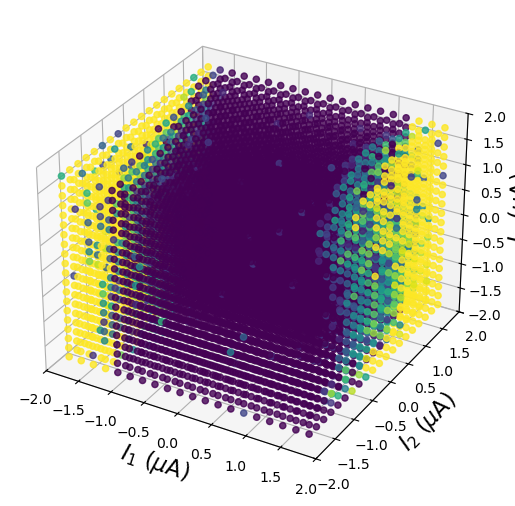

514 346
536 361
536 328
311 219


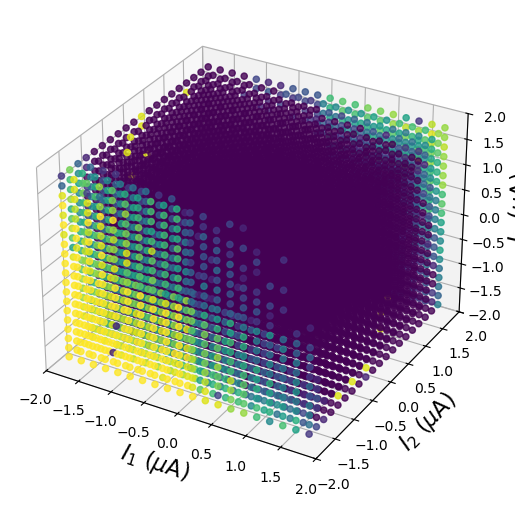

536 228
311 222


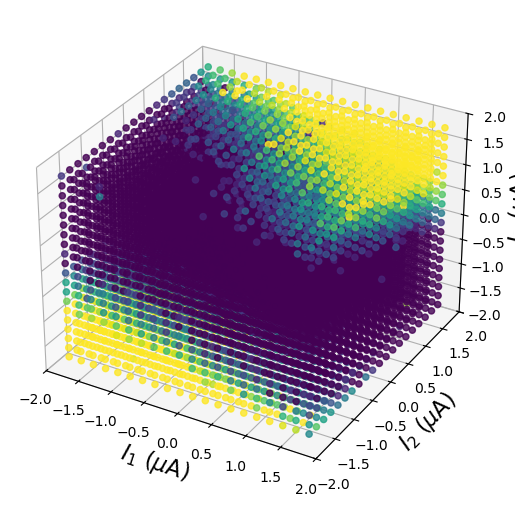

536 752
514 267
536 346
514 304
514 303
514 329
514 330
514 268
514 345
536 59
536 316
(3, 8000) (3, 8000)
311 0.99


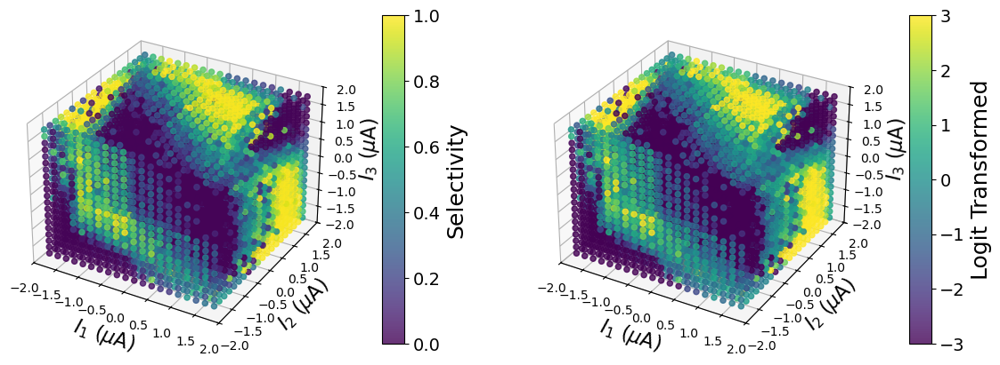

In [5]:
datapath = '/Volumes/Lab/Users/praful/Vasireddy2025/data'
dataset = '2020-09-29-2'
pattern = 311

file_list = os.listdir(datapath)

ms = [1, 2, 3, 4, 5]
zero_prob = 0.01
slope_bound = 100
R2_thresh = 0.025
reg_param = 0.5
method = 'L-BFGS-B'
reg_method = 'l2'

patterns = {}
for file in file_list:
    if file.endswith('.mat') and file.startswith('triplet'):
        file_dataset = file.split('.mat')[0].split('_')[-3]
        if file_dataset != dataset:
            continue
        pattern_cell = file.split('.mat')[0].split('_')[-1]
        p = int(file.split('.mat')[0].split('_')[-2].replace('p', ''))
        c = int(file.split('.mat')[0].split('_')[-1].replace('c', ''))
        print(p, c)
        if p != pattern:
            continue
        
        data = loadmat(os.path.join(datapath, file))
        amps_gsort = data['amps_all']
        probs_flipped = data['probs_flipped'].flatten()
        num_trials = data['trials_all'].flatten()
        
        spikes_cp = []
        for i in range(len(num_trials)):
            num1s = int(np.around(probs_flipped[i] * num_trials[i], 0))
            num0s = num_trials[i] - num1s

            spikes_amp = np.random.permutation(np.concatenate((np.ones(num1s), np.zeros(num0s)))).astype(int)
            spikes_cp.append(spikes_amp)
        spikes_cp = np.array(spikes_cp, dtype=object)

        # At this point X has all the amps, and probs_fit has all the empirical probabilities

        fig = plt.figure(2)
        fig.clear()
        ax = Axes3D(fig, auto_add_to_figure=False)
        fig.add_axes(ax)
        plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
        plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
        plt.xlim(-2, 2)
        plt.ylim(-2, 2)
        ax.set_zlim(-2, 2)
        ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

        scat = ax.scatter(amps_gsort[:, 0], 
                            amps_gsort[:, 1],
                            amps_gsort[:, 2], marker='o', 
                            c=probs_flipped, s=20, alpha=0.8, vmin=0, vmax=1)
        plt.show()

        if p not in patterns:
            patterns[p] = []
        patterns[p].append((c, probs_flipped, spikes_cp, num_trials))

selectivities = {}
for p in patterns:
    cells = [c for c, _, _, _ in patterns[p]]
    probs_all = np.vstack([probs for _, probs, _, _ in patterns[p]])
    spikes_all = np.array([spikes for _, _, spikes, _ in patterns[p]], dtype=object)
    trials_all = patterns[p][0][-1]
    print(probs_all.shape, spikes_all.shape)

    if len(cells) < 2:
        continue

    selectivity = global_selectivity(probs_all)
    selectivity = np.clip(selectivity, 1e-2, 1-1e-2)

    selectivity_logit = np.log(selectivity/(1-selectivity))
    selectivities[p] = (selectivity, selectivity_logit, probs_all, spikes_all, trials_all)
    print(p, np.amax(selectivity))

    fig = plt.figure(figsize=(14, 6))

    ax1 = fig.add_subplot(121, projection='3d')
    scat1 = ax1.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                        c=selectivity, marker='o', s=20, alpha=0.8, vmin=0, vmax=1)
    ax1.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax1.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax1.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax1.set_xlim(-2, 2)
    ax1.set_ylim(-2, 2)
    ax1.set_zlim(-2, 2)
    cbar1 = fig.colorbar(scat1, ax=ax1, shrink=0.8, aspect=15, pad=0.1)
    cbar1.ax.tick_params(labelsize=14)  # Larger tick labels
    cbar1.set_label('Selectivity', fontsize=18)  # Larger label

    # Panel 2: Subsampled selectivity
    ax2 = fig.add_subplot(122, projection='3d')
    scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                        c=selectivity_logit, marker='o', s=20, alpha=0.8, vmin=-3, vmax=3)
    ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax2.set_xlim(-2, 2)
    ax2.set_ylim(-2, 2)
    ax2.set_zlim(-2, 2)
    cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
    cbar2.ax.tick_params(labelsize=14)  # Larger tick labels
    cbar2.set_label('Logit Transformed', fontsize=18)  # Larger label
    plt.show()

In [6]:
for p in patterns:
    spikes_all = selectivities[p][3]
    probs_all = selectivities[p][2]

    for i in range(len(spikes_all)):
        for j in range(len(spikes_all[i])):
            assert np.around(np.mean(spikes_all[i][j]), 3) == np.around(probs_all[i][j], 3), f"Mismatch between spikes and true probabilities at ({i}, {j})"

In [7]:
patterns

{311: [(218,
   array([0., 0., 0., ..., 1., 1., 1.]),
   array([array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
          array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
          array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
          ...,
          array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
          array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
          array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])],
         dtype=object),
   array([20, 20, 20, ..., 20, 19, 19])),
  (219,
   array([0.        , 0.        , 0.        , ..., 0.15000001, 0.89473683,
          0.84210527]),
   array([array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
          array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
          array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
          ...,
          array([1, 0, 1, 0, 0, 1, 0,

In [8]:
def logit_r_squared(y_true, y_pred):
    y_true = np.clip(y_true, 1e-2, 1-1e-2)
    y_pred = np.clip(y_pred, 1e-2, 1-1e-2)
    y_true_logit = np.log(y_true/(1-y_true))
    y_pred_logit = np.log(y_pred/(1-y_pred))
    ss_res = np.sum((y_true_logit - y_pred_logit) ** 2)
    ss_tot = np.sum((y_true_logit - np.mean(y_true_logit)) ** 2)
    return 1 - (ss_res / ss_tot)

def logit_ccc(y_true, y_pred):
    y_true = np.clip(y_true, 1e-2, 1-1e-2)
    y_pred = np.clip(y_pred, 1e-2, 1-1e-2)
    y_true_logit = np.log(y_true/(1-y_true))
    y_pred_logit = np.log(y_pred/(1-y_pred))
    # Concordance correlation coefficient

    # Means
    y_true_mean = np.mean(y_true_logit)
    y_pred_mean = np.mean(y_pred_logit)

    # Variances
    y_true_var = np.var(y_true_logit)
    y_pred_var = np.var(y_pred_logit)

    # correlation coefficient
    corr_coef = np.corrcoef(y_true_logit, y_pred_logit)[0, 1]

    ccc = 2 * corr_coef * np.sqrt(y_true_var) * np.sqrt(y_pred_var) / (y_true_var + y_pred_var + (y_true_mean - y_pred_mean) ** 2)
    return ccc

Iteration 1/10000 - Training Loss: 7.04981803894043
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 6.58403205871582
  Lengthscale: tensor([[0.6398]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7494], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 6.15197229385376
  Lengthscale: tensor([[0.5943]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8015], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.7918877601623535
  Lengthscale: tensor([[0.5520]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8534], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.486485481262207
  Lengthscale: tensor([[0.5131]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9040], device='cuda:0', grad_fn=<AddBackward0>

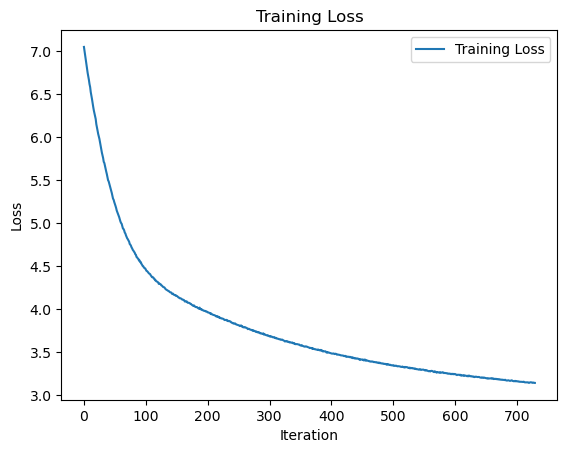

Iteration 1/10000 - Training Loss: 7.044797420501709
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 6.567091941833496
  Lengthscale: tensor([[0.6398]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7494], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 6.160303592681885
  Lengthscale: tensor([[0.5943]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8015], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.796502590179443
  Lengthscale: tensor([[0.5520]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8534], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.4873199462890625
  Lengthscale: tensor([[0.5131]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9040], device='cuda:0', grad_fn=<AddBackwar

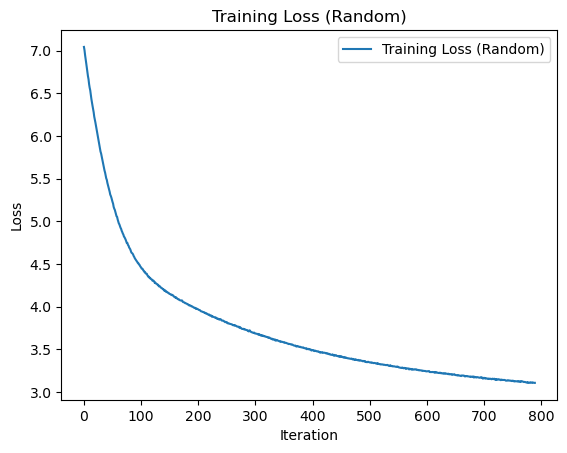

Number of sites: 1, Test R2: -0.9391052642337392
Number of sites: 2, Test R2: 0.2817081756327675
Number of sites: 3, Test R2: 0.1881325740888461
Number of sites: 1, Test R2: 0.22918179011941053
Number of sites: 2, Test R2: 0.008537351670993343
Number of sites: 1, Test R2: -1.0978721531023035
Number of sites: 2, Test R2: 0.3497990149661395
Number of sites: 3, Test R2: 0.2703959260084722


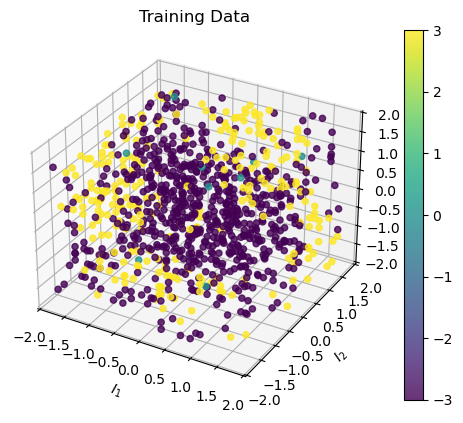

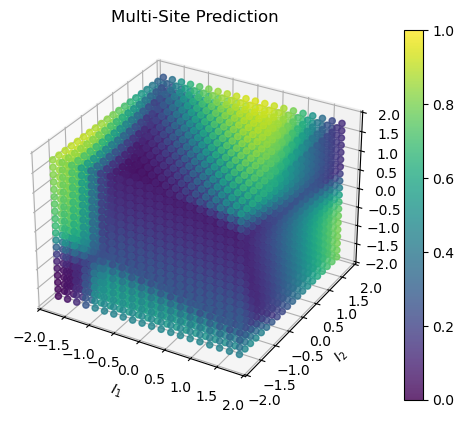

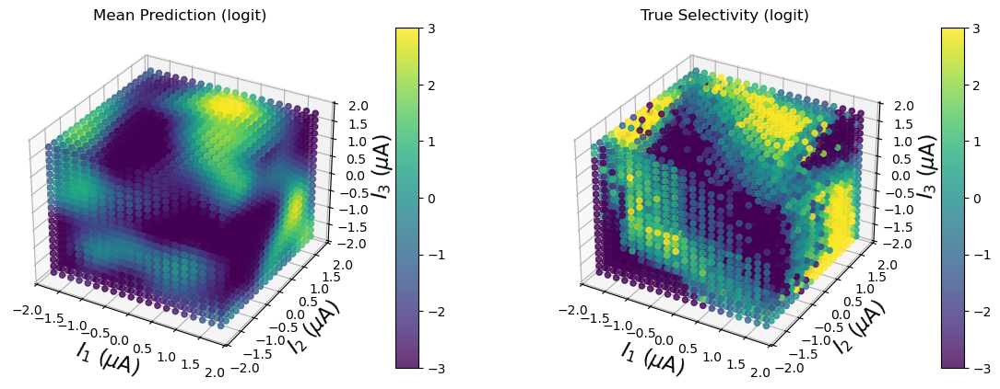

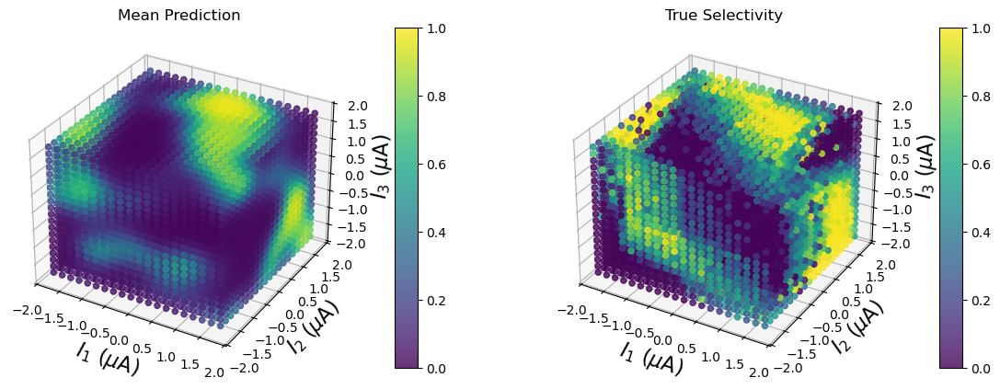

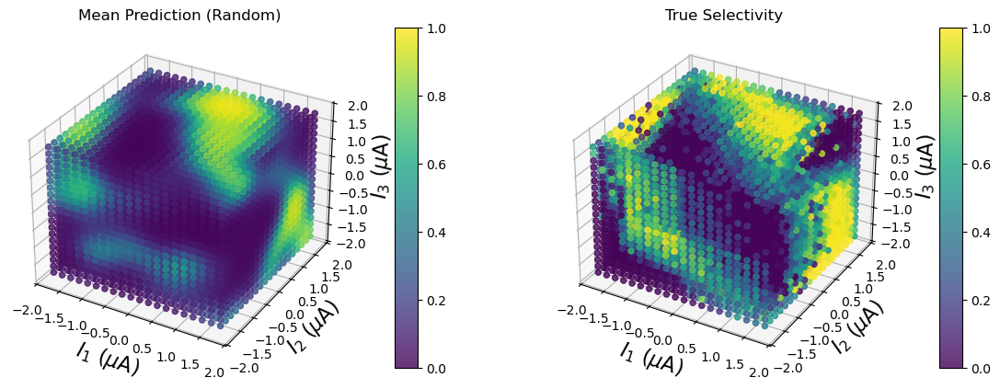

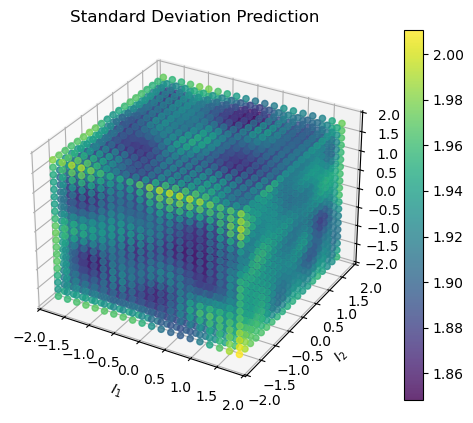

RMSE: 0.3429642911121793, RMSE (Random): 0.34368514982425424, RMSE (Multisite): 0.31771947098987696
MAE: 0.2496619924756765, MAE (Random): 0.25119400292573446, MAE (Multisite): 0.2830420889368712
MAE (Everywhere): 0.12133663916891393, MAE (Random, Everywhere): 0.12120782136837872, MAE (Multisite, Everywhere): 0.1295659108903123
RMSE (logit): 3.116097545863299, RMSE (Random, logit): 3.132108852767906, RMSE (Multisite, logit): 3.343161734990775
MAE (logit): 2.7419952052596677, MAE (Random, logit): 2.761605930655544, MAE (Multisite, logit): 3.1687812370983797
MAE (Everywhere, logit): 1.193939382559402, MAE (Random, Everywhere, logit): 1.1939958161698856, MAE (Multisite, Everywhere, logit): 1.490053548179118
R2: 0.6766862601078958, R2 (Random): 0.676038954447288, R2 (Multisite): 0.5376951737181754
CCC: 0.7863690810844631, CCC (Random): 0.7852637246847382, CCC (Multisite): 0.6608434664245961


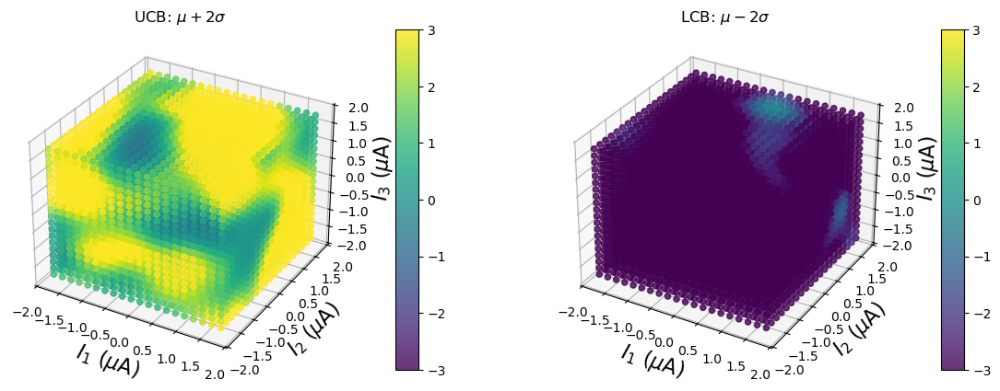

Iteration 1/10000 - Training Loss: 8.28177261352539
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 7.716683864593506
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7494], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 7.223576545715332
  Lengthscale: tensor([[0.5949]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8017], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 6.802196502685547
  Lengthscale: tensor([[0.5536]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8541], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 6.422612190246582
  Lengthscale: tensor([[0.5162]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9057], device='cuda:0', grad_fn=<AddBackward0

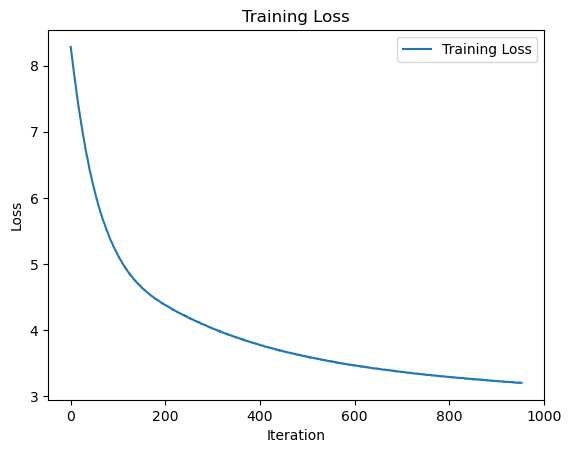

Iteration 1/10000 - Training Loss: 6.911832332611084
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 6.461287975311279
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7494], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 6.064542293548584
  Lengthscale: tensor([[0.5947]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8017], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.720621585845947
  Lengthscale: tensor([[0.5526]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8540], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.4270172119140625
  Lengthscale: tensor([[0.5137]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9054], device='cuda:0', grad_fn=<AddBackwar

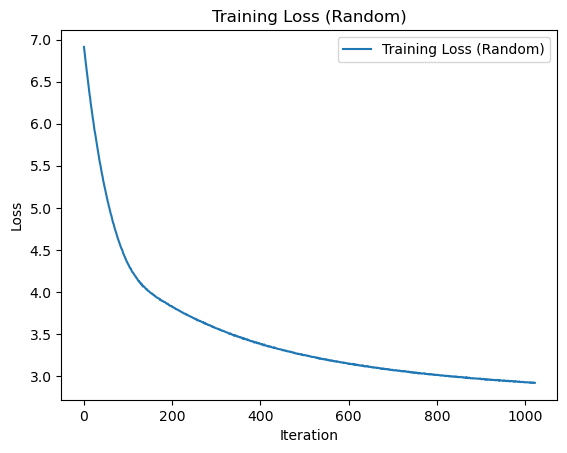

Number of sites: 1, Test R2: -0.5932068624315019
Number of sites: 2, Test R2: 0.33962762656648393
Number of sites: 3, Test R2: 0.28972327220154115
Number of sites: 1, Test R2: -0.19013105735705782
Number of sites: 2, Test R2: 0.2817270686573863
Number of sites: 3, Test R2: 0.16616268093140718
Number of sites: 1, Test R2: -0.8006570025985398
Number of sites: 2, Test R2: 0.40313192877502213
Number of sites: 3, Test R2: 0.35410002278831265


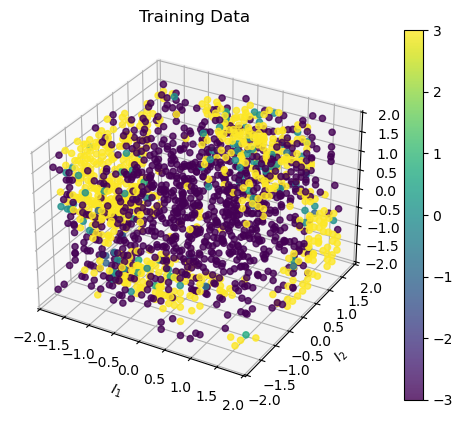

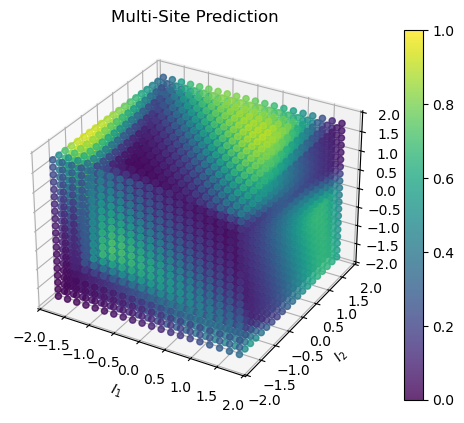

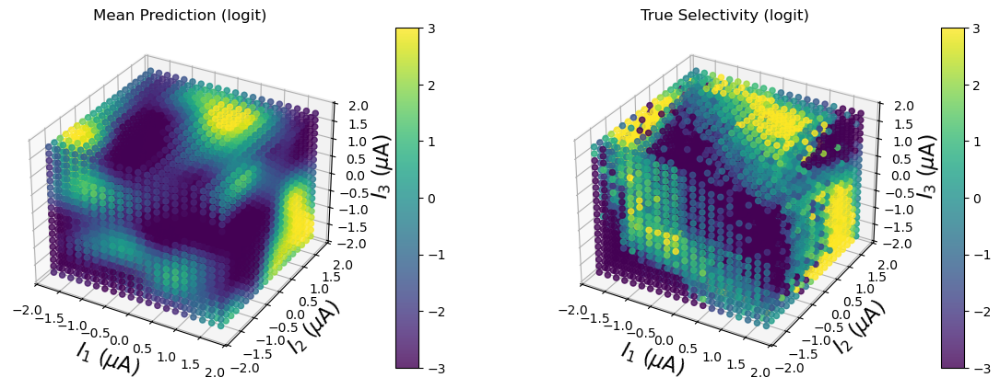

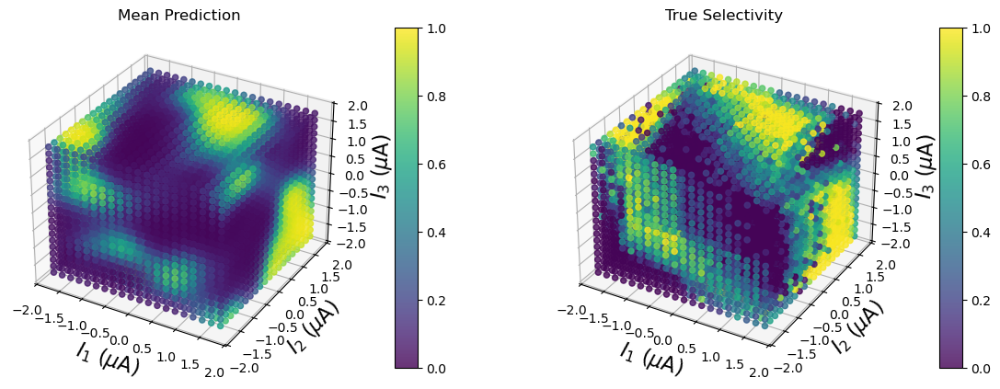

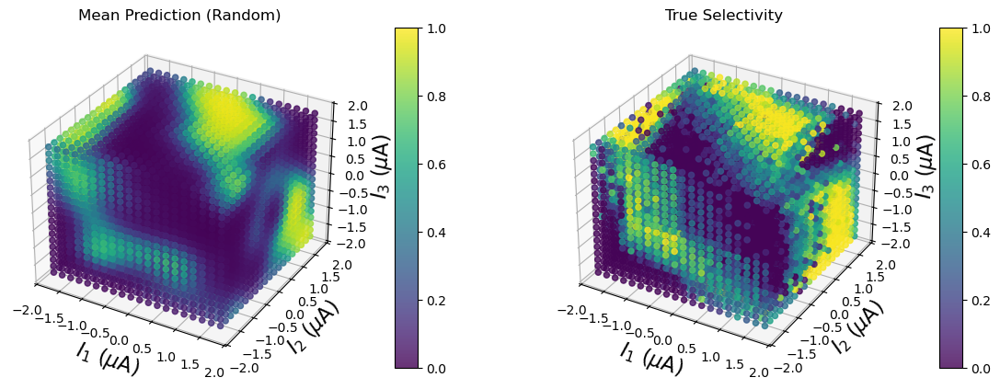

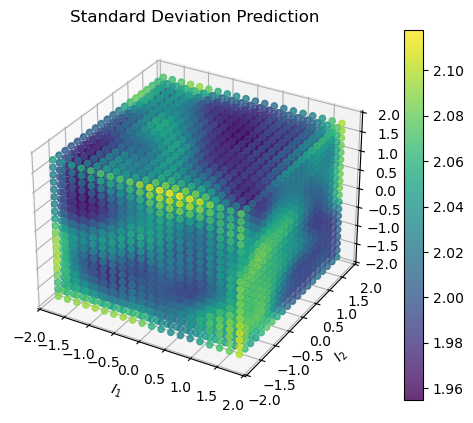

RMSE: 0.2588628803277421, RMSE (Random): 0.27765831944103986, RMSE (Multisite): 0.2863109340009393
MAE: 0.15863828029585494, MAE (Random): 0.18904082173555314, MAE (Multisite): 0.25230206395063237
MAE (Everywhere): 0.10258854518419178, MAE (Random, Everywhere): 0.1002322115691915, MAE (Multisite, Everywhere): 0.09923476043329824
RMSE (logit): 2.4340539199850886, RMSE (Random, logit): 2.7174862133128728, RMSE (Multisite, logit): 3.225230208863848
MAE (logit): 1.9956914896354434, MAE (Random, logit): 2.341886862175998, MAE (Multisite, logit): 3.049343042772635
MAE (Everywhere, logit): 1.0843763956892802, MAE (Random, Everywhere, logit): 1.020763111727123, MAE (Multisite, Everywhere, logit): 1.2300926621843262
R2: 0.7398592486289612, R2 (Random): 0.7540201825859139, R2 (Multisite): 0.6510578284820685
CCC: 0.8355588645860301, CCC (Random): 0.843646690146487, CCC (Multisite): 0.7483966428433412


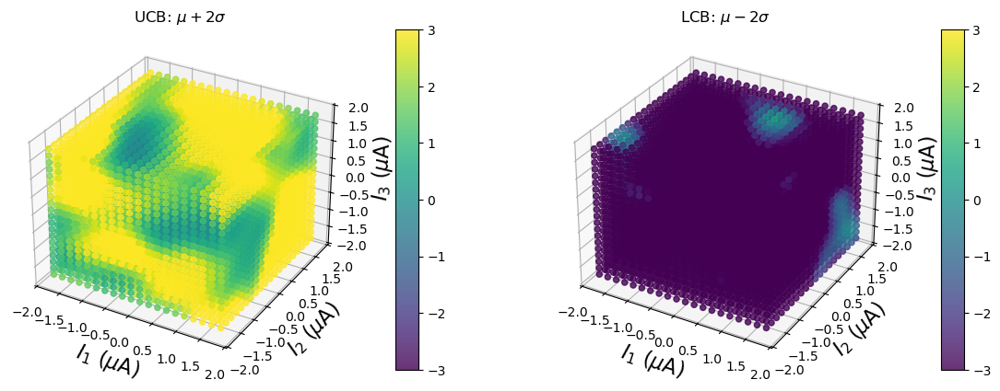

Iteration 1/10000 - Training Loss: 8.158246994018555
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 7.608455181121826
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 7.126598358154297
  Lengthscale: tensor([[0.5950]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 6.71237850189209
  Lengthscale: tensor([[0.5539]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8542], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 6.35183572769165
  Lengthscale: tensor([[0.5168]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9060], device='cuda:0', grad_fn=<AddBackward0>

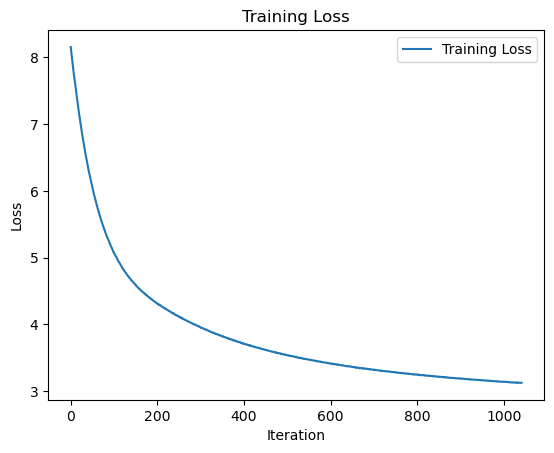

Iteration 1/10000 - Training Loss: 6.721031665802002
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 6.287220001220703
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7494], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 5.904492378234863
  Lengthscale: tensor([[0.5948]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8017], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.5758795738220215
  Lengthscale: tensor([[0.5530]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8541], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.297208309173584
  Lengthscale: tensor([[0.5146]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9057], device='cuda:0', grad_fn=<AddBackwar

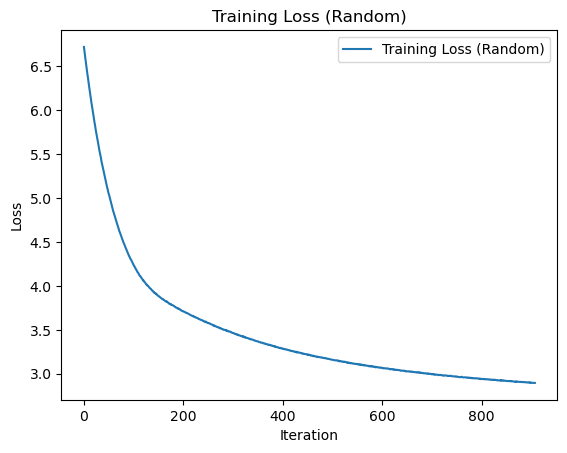

Number of sites: 1, Test R2: -0.39998649087415195
Number of sites: 2, Test R2: 0.41850884678808065
Number of sites: 3, Test R2: 0.38465308335343273
Number of sites: 1, Test R2: -0.2110714692383877
Number of sites: 2, Test R2: 0.3858415099853275
Number of sites: 3, Test R2: 0.3185162396391168
Number of sites: 1, Test R2: -0.8920898593508759
Number of sites: 2, Test R2: 0.4758137986890363
Number of sites: 3, Test R2: 0.4412991231335054


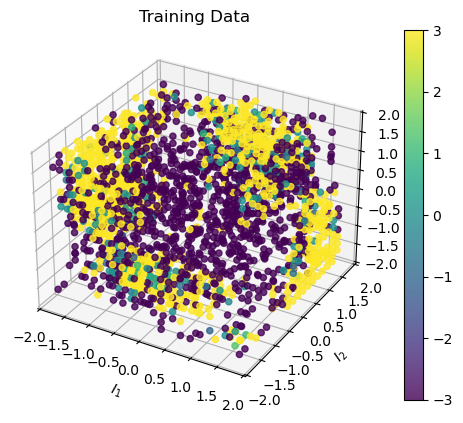

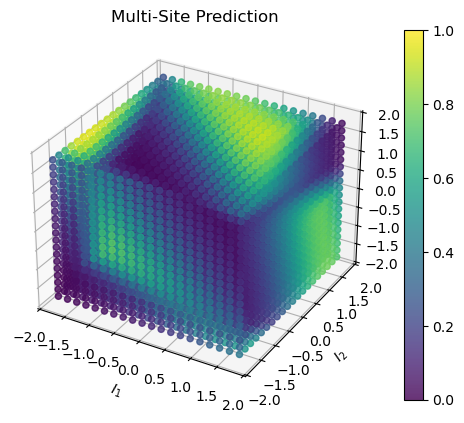

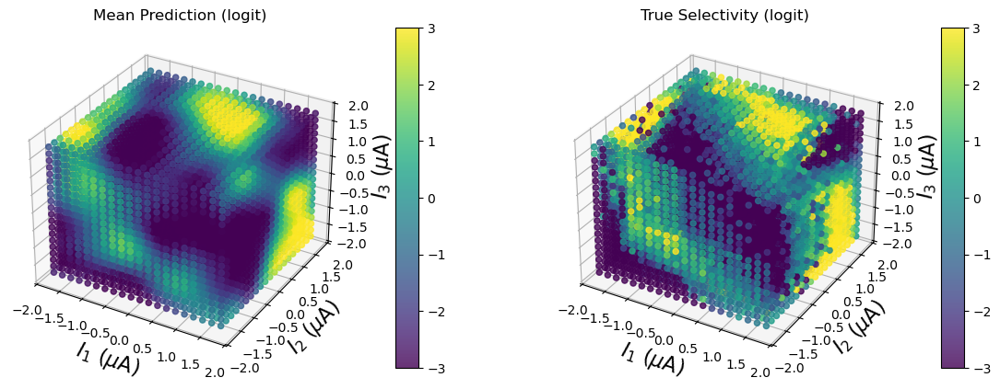

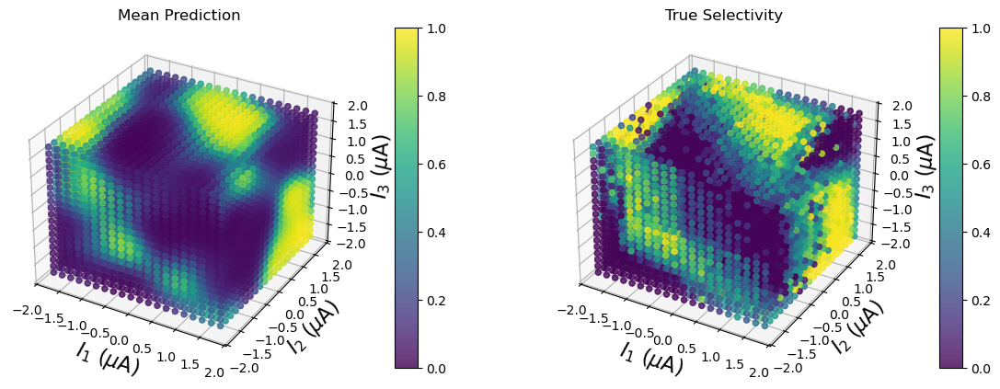

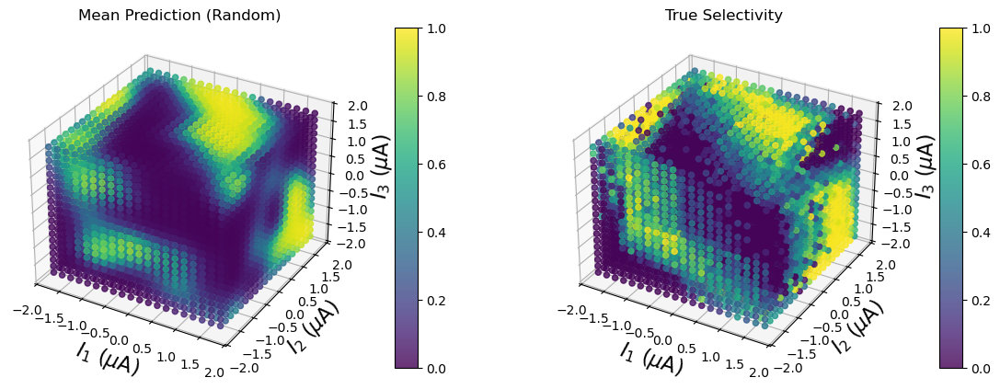

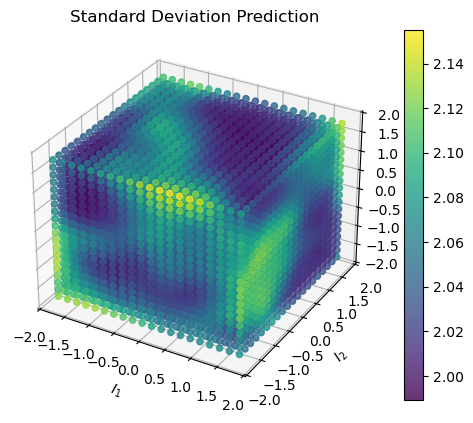

RMSE: 0.21484622225538144, RMSE (Random): 0.24857302815835458, RMSE (Multisite): 0.2523590397094011
MAE: 0.12407183755831173, MAE (Random): 0.1601686739347542, MAE (Multisite): 0.21580672196187686
MAE (Everywhere): 0.09278354568175774, MAE (Random, Everywhere): 0.09372948174723598, MAE (Multisite, Everywhere): 0.09014347968738019
RMSE (logit): 2.118134467050084, RMSE (Random, logit): 2.4530306561802875, RMSE (Multisite, logit): 3.0207645913452357
MAE (logit): 1.7039073901523505, MAE (Random, logit): 2.0784319150455333, MAE (Multisite, logit): 2.830974179326232
MAE (Everywhere, logit): 1.0252990204533672, MAE (Random, Everywhere, logit): 0.9566197229299105, MAE (Multisite, Everywhere, logit): 1.119573915748836
R2: 0.7715426293111658, R2 (Random): 0.7776471876711605, R2 (Multisite): 0.693760128121815
CCC: 0.8603582771715836, CCC (Random): 0.8646718364143019, CCC (Multisite): 0.7875471228719758


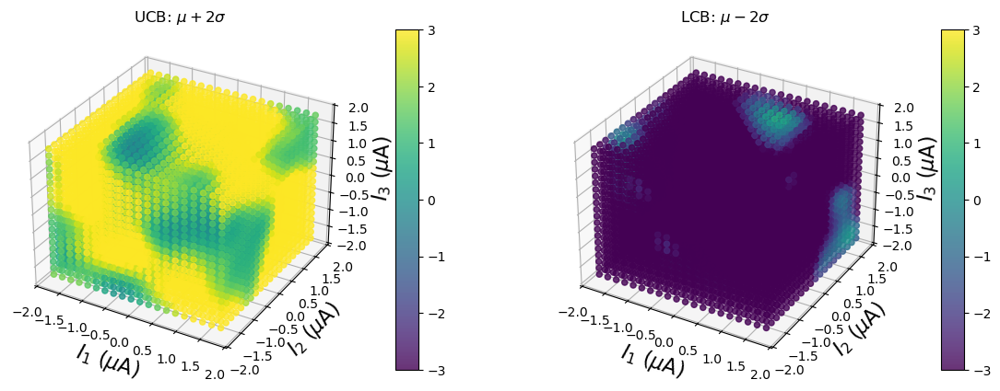

Iteration 1/10000 - Training Loss: 7.792782306671143
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 7.268359184265137
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 6.816619873046875
  Lengthscale: tensor([[0.5952]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 6.417538166046143
  Lengthscale: tensor([[0.5544]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8542], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 6.086486339569092
  Lengthscale: tensor([[0.5175]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9061], device='cuda:0', grad_fn=<AddBackward

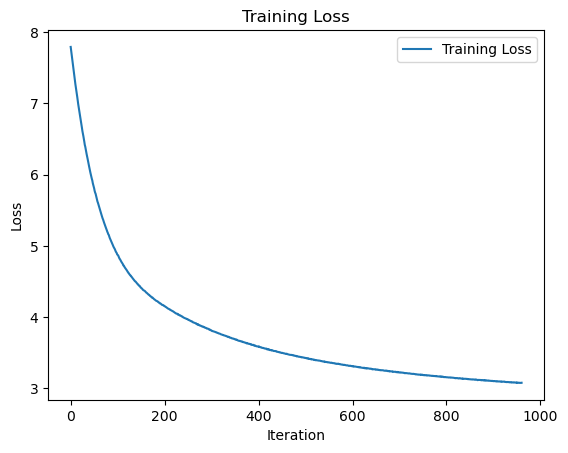

Iteration 1/10000 - Training Loss: 6.431004524230957
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 6.020871639251709
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 5.662914752960205
  Lengthscale: tensor([[0.5947]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.354753494262695
  Lengthscale: tensor([[0.5530]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8542], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.082233905792236
  Lengthscale: tensor([[0.5147]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9058], device='cuda:0', grad_fn=<AddBackward

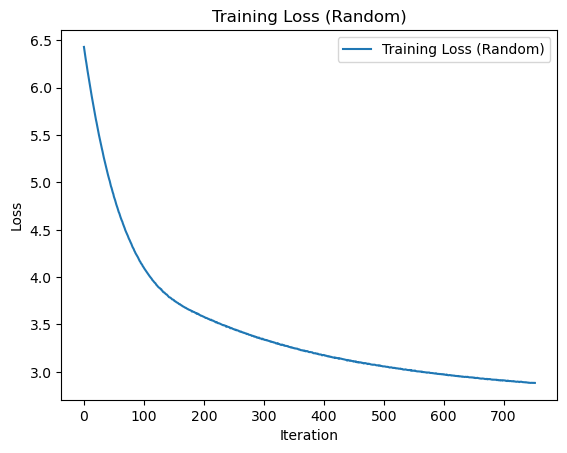

Number of sites: 1, Test R2: -0.8625363657813134
Number of sites: 2, Test R2: 0.5310680289419711
Number of sites: 3, Test R2: 0.5013370735344655
Number of sites: 1, Test R2: -0.09551764563658383
Number of sites: 2, Test R2: 0.38544504241996913
Number of sites: 3, Test R2: 0.34979952356055544
Number of sites: 1, Test R2: -0.926965363297481
Number of sites: 2, Test R2: 0.49663320039994163
Number of sites: 3, Test R2: 0.468511815827245


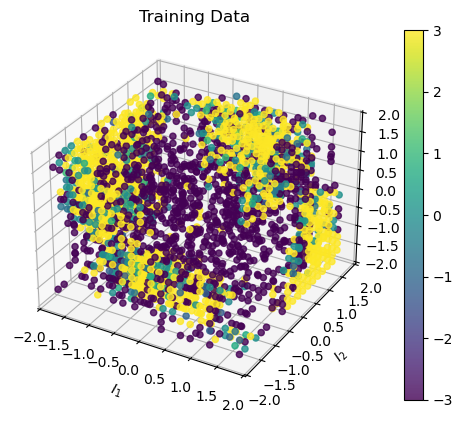

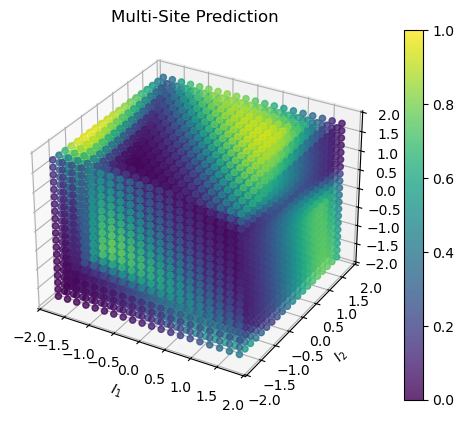

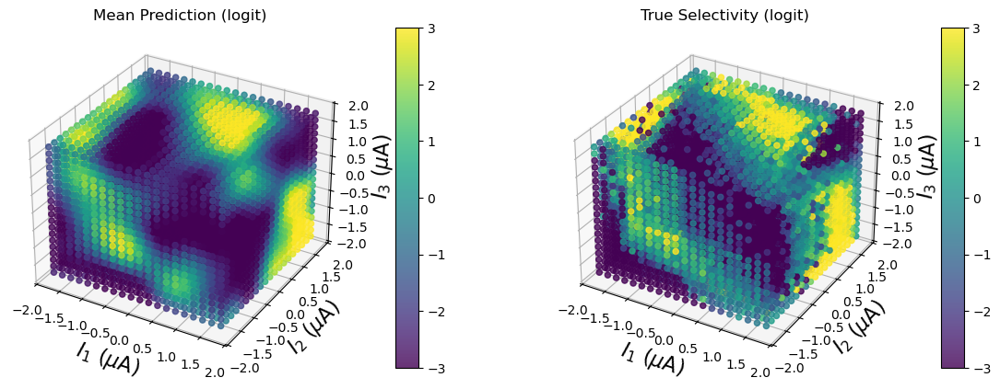

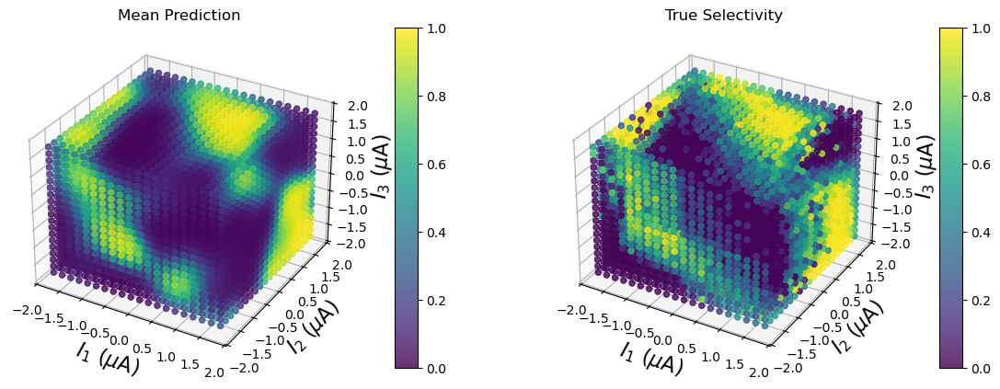

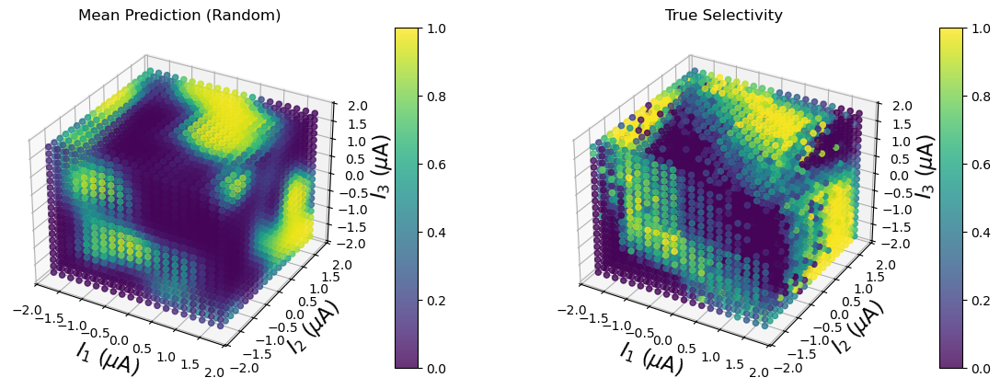

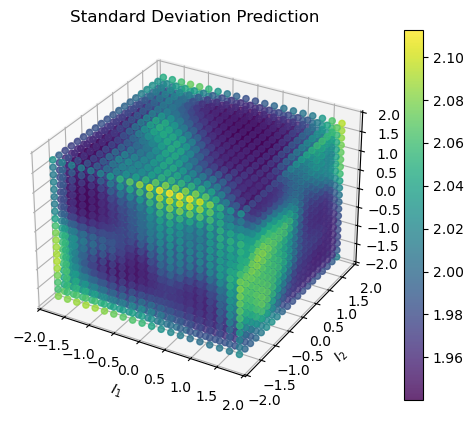

RMSE: 0.19942975578790312, RMSE (Random): 0.22461383312621966, RMSE (Multisite): 0.24947089811556789
MAE: 0.11266999529944352, MAE (Random): 0.13898878625782504, MAE (Multisite): 0.20943378299362786
MAE (Everywhere): 0.09169429734846701, MAE (Random, Everywhere): 0.08917516268571626, MAE (Multisite, Everywhere): 0.0898026003807405
RMSE (logit): 1.982693811778358, RMSE (Random, logit): 2.234588768683903, RMSE (Multisite, logit): 2.9773873239863864
MAE (logit): 1.5859185435599739, MAE (Random, logit): 1.8640462692756667, MAE (Multisite, logit): 2.7718430668718375
MAE (Everywhere, logit): 1.0190396558484778, MAE (Random, Everywhere, logit): 0.9113249665304913, MAE (Multisite, Everywhere, logit): 1.0784630669634274
R2: 0.7772752099164824, R2 (Random): 0.7946495939850472, R2 (Multisite): 0.7085444952880611
CCC: 0.8667565060183929, CCC (Random): 0.8798155615333728, CCC (Multisite): 0.8012470125900252


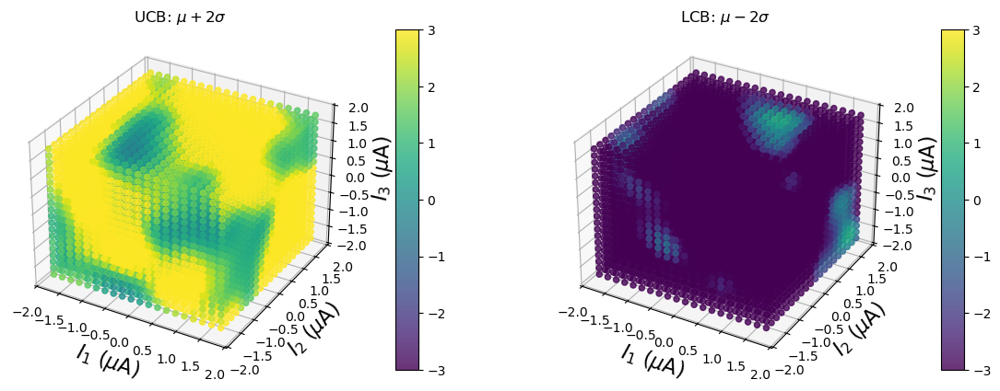

Iteration 1/10000 - Training Loss: 7.432771682739258
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 6.943092346191406
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 6.517895221710205
  Lengthscale: tensor([[0.5952]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 6.154852390289307
  Lengthscale: tensor([[0.5543]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8543], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.837618350982666
  Lengthscale: tensor([[0.5172]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9063], device='cuda:0', grad_fn=<AddBackward

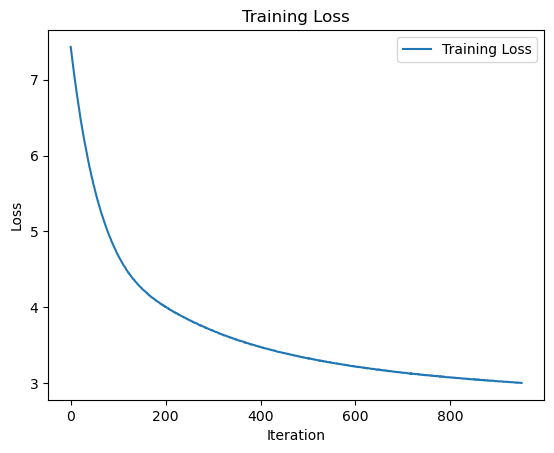

Iteration 1/10000 - Training Loss: 6.314596176147461
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 5.9210004806518555
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 5.574213027954102
  Lengthscale: tensor([[0.5951]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.272693157196045
  Lengthscale: tensor([[0.5541]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8543], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.011941909790039
  Lengthscale: tensor([[0.5167]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9061], device='cuda:0', grad_fn=<AddBackwar

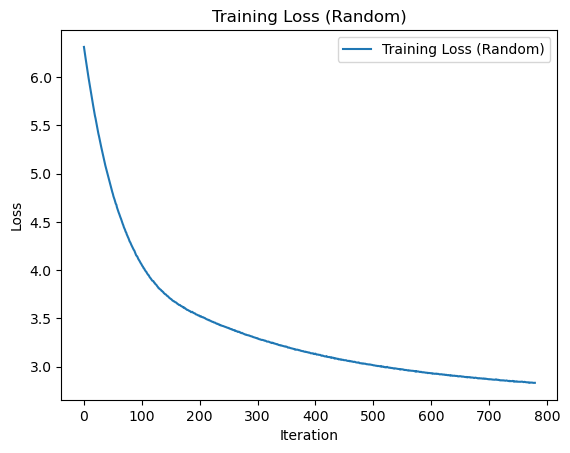

Number of sites: 1, Test R2: -0.3920406015105138
Number of sites: 2, Test R2: 0.5298378912977926
Number of sites: 3, Test R2: 0.4987755937426419
Number of sites: 1, Test R2: 0.03548459295891926
Number of sites: 2, Test R2: 0.41793847880057533
Number of sites: 3, Test R2: 0.3715516751310245
Number of sites: 1, Test R2: -0.8866213848896403
Number of sites: 2, Test R2: 0.5878658221906792
Number of sites: 3, Test R2: 0.5644400026426502


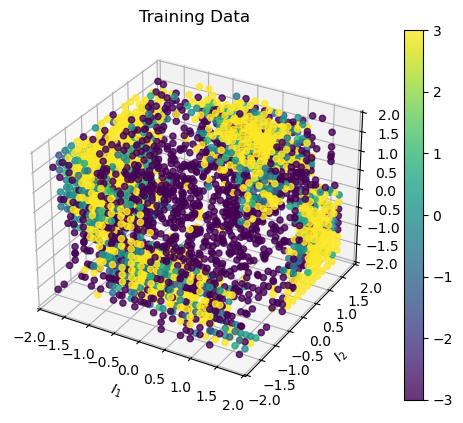

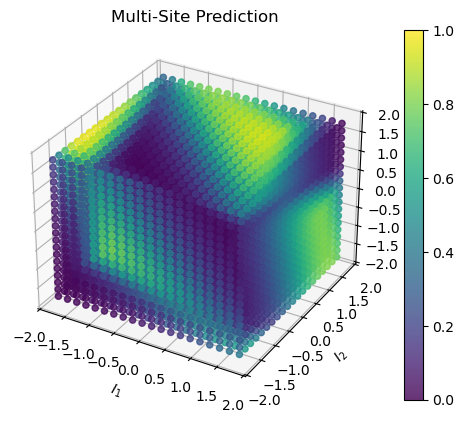

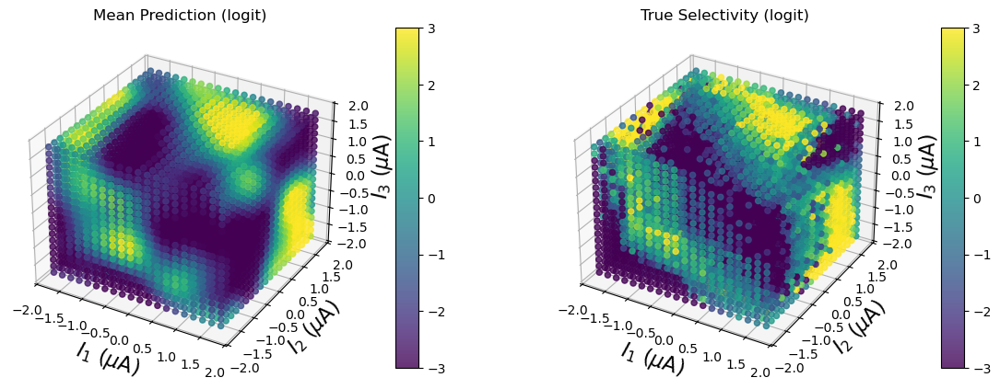

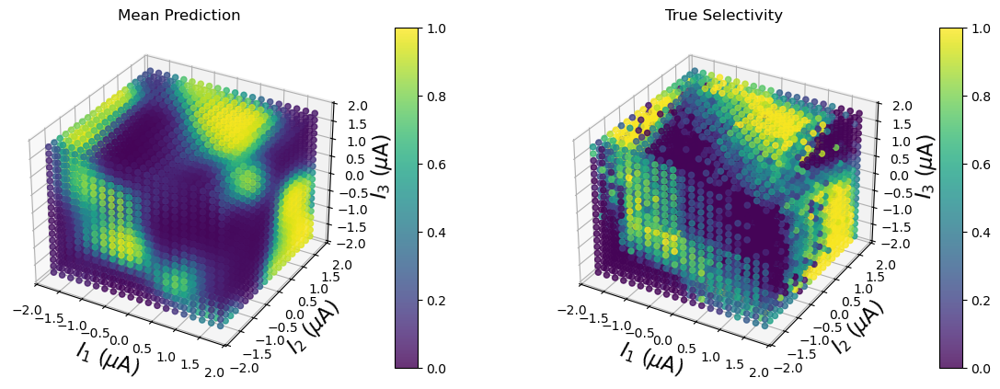

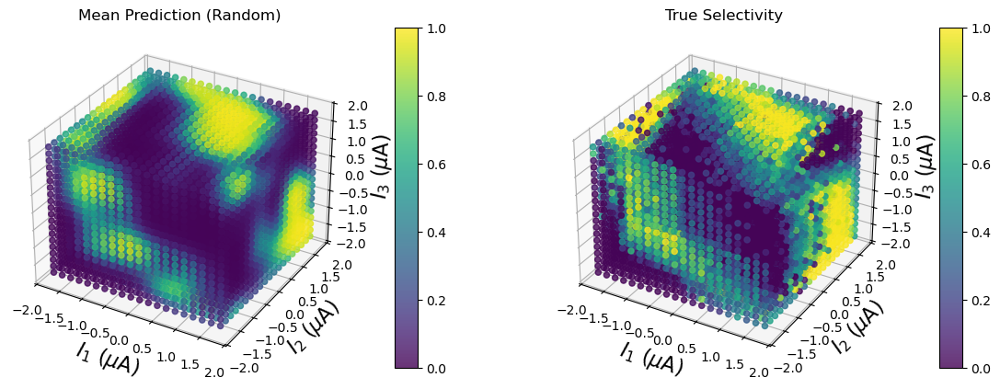

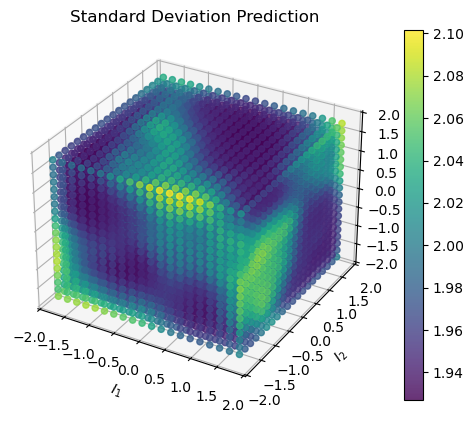

RMSE: 0.1916185230303743, RMSE (Random): 0.21703964096344353, RMSE (Multisite): 0.23508343737148393
MAE: 0.10605453103326501, MAE (Random): 0.1315735022123765, MAE (Multisite): 0.19258055275956357
MAE (Everywhere): 0.08852237072736129, MAE (Random, Everywhere): 0.08725766565459536, MAE (Multisite, Everywhere): 0.0843004272223233
RMSE (logit): 1.9211060008652563, RMSE (Random, logit): 2.156458474008016, RMSE (Multisite, logit): 2.8713656996254007
MAE (logit): 1.525296851157935, MAE (Random, logit): 1.772142159135467, MAE (Multisite, logit): 2.6570114898414734
MAE (Everywhere, logit): 0.999171151369226, MAE (Random, Everywhere, logit): 0.8870605614717201, MAE (Multisite, Everywhere, logit): 1.030786101829928
R2: 0.7851409315263328, R2 (Random): 0.8042457716449829, R2 (Multisite): 0.7262693330307637
CCC: 0.872206504691832, CCC (Random): 0.8867270234852441, CCC (Multisite): 0.8160983636881363


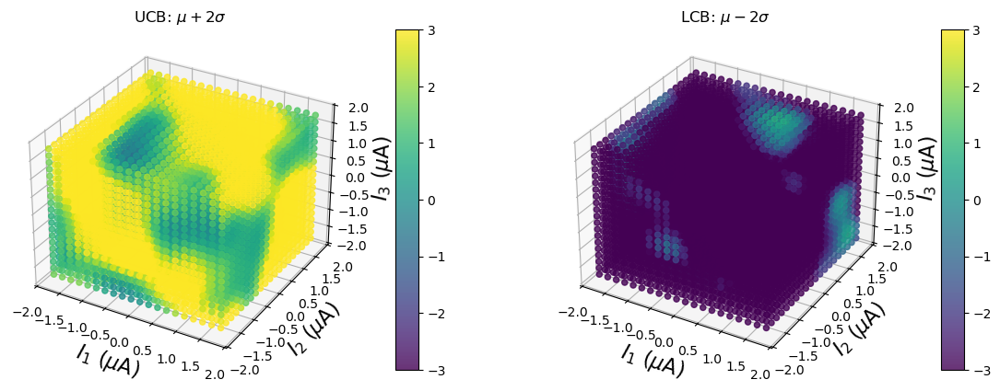

Iteration 1/10000 - Training Loss: 6.930261611938477
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 6.483558654785156
  Lengthscale: tensor([[0.6400]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 6.088002681732178
  Lengthscale: tensor([[0.5953]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.752012252807617
  Lengthscale: tensor([[0.5547]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8543], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 5.467885494232178
  Lengthscale: tensor([[0.5181]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9062], device='cuda:0', grad_fn=<AddBackward

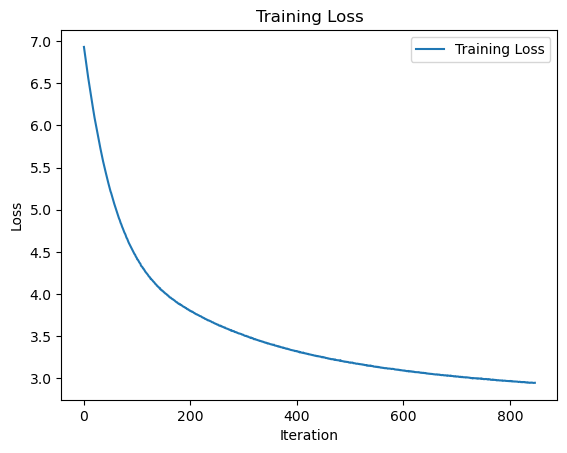

Iteration 1/10000 - Training Loss: 6.097280025482178
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 5.71804666519165
  Lengthscale: tensor([[0.6399]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7495], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 5.385146617889404
  Lengthscale: tensor([[0.5953]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8018], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 5.095518589019775
  Lengthscale: tensor([[0.5545]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8543], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 4.856612682342529
  Lengthscale: tensor([[0.5176]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.9062], device='cuda:0', grad_fn=<AddBackward0

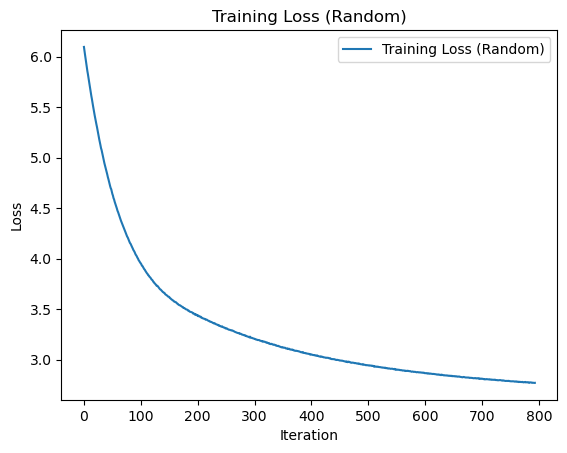

Number of sites: 1, Test R2: -0.48258444765362385
Number of sites: 2, Test R2: 0.5314115396112313
Number of sites: 3, Test R2: 0.5123604826592302
Number of sites: 1, Test R2: 0.05073707850962261
Number of sites: 2, Test R2: 0.4488703691992484
Number of sites: 3, Test R2: 0.39867945696258156
Number of sites: 1, Test R2: -0.7784219566565684
Number of sites: 2, Test R2: 0.564328764460954
Number of sites: 3, Test R2: 0.5429600373386159


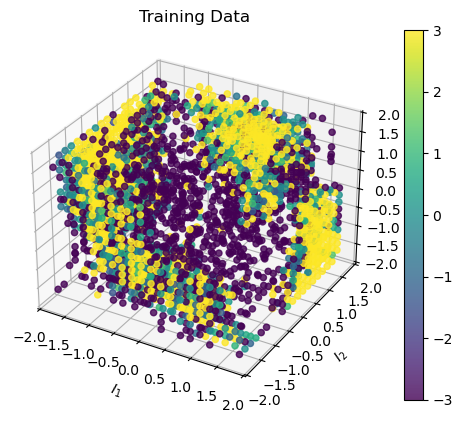

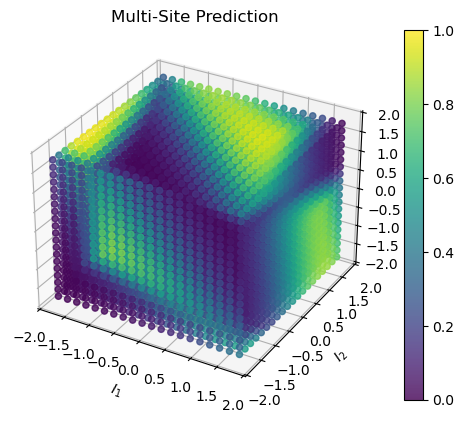

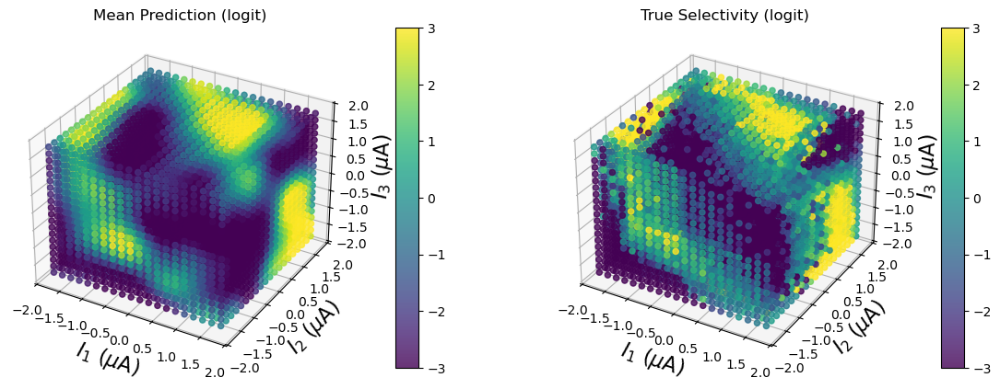

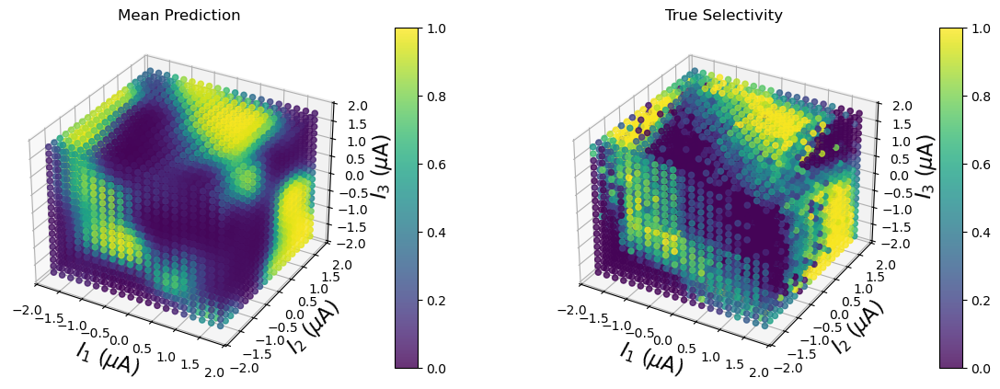

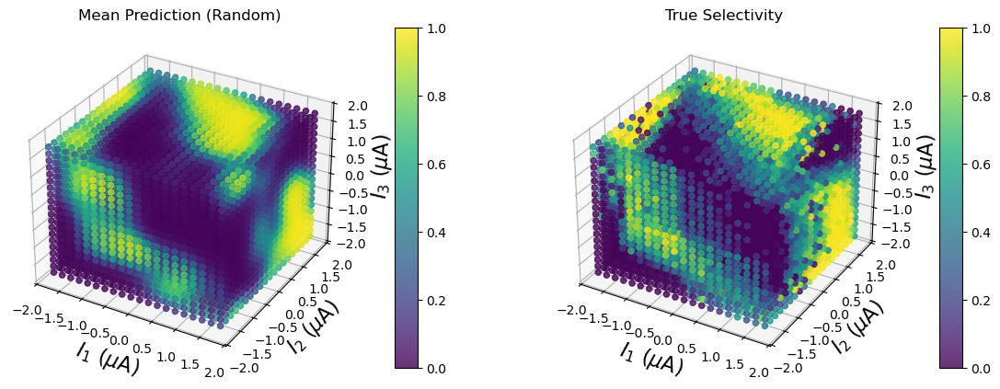

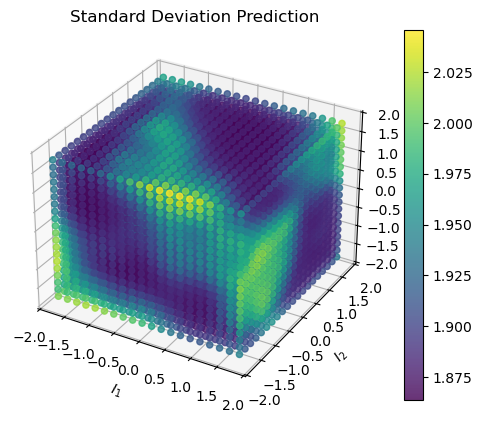

RMSE: 0.18324178851835188, RMSE (Random): 0.19880453631521744, RMSE (Multisite): 0.21998560137631465
MAE: 0.10041661892487316, MAE (Random): 0.11944369541188653, MAE (Multisite): 0.17417603549180047
MAE (Everywhere): 0.08626473447020283, MAE (Random, Everywhere): 0.08369272998807181, MAE (Multisite, Everywhere): 0.08054771135693232
RMSE (logit): 1.8416153114422287, RMSE (Random, logit): 2.0166807689947963, RMSE (Multisite, logit): 2.7420011000451994
MAE (logit): 1.4471186108917589, MAE (Random, logit): 1.6646111855305763, MAE (Multisite, logit): 2.5127884295272978
MAE (Everywhere, logit): 0.9809619667106738, MAE (Random, Everywhere, logit): 0.8591257814889631, MAE (Multisite, Everywhere, logit): 0.9961716539686589
R2: 0.7921570808143882, R2 (Random): 0.8178828009709319, R2 (Multisite): 0.7394247290833611
CCC: 0.8780737348063773, CCC (Random): 0.8963424675083208, CCC (Multisite): 0.8283440496869857


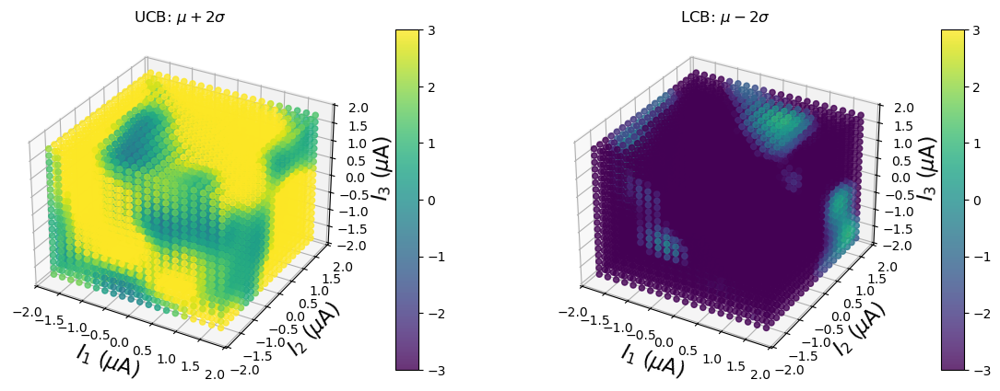

In [9]:
beta = 2
lcb_cutoff = 3    # ln(0.8/0.2) = 1.5, ln(0.9/0.1) = 2.2, ln(0.95/0.05) = 3
selec_cutoff = 2
batch_size = 1000
num_steps = 6
init_trials = 1000

pattern = 311

# Step 0: Initialize the data
init_inds = np.random.choice(np.arange(len(amps_gsort), dtype=int), init_trials, replace=True)

# Count occurrences of each index
T_prev = np.bincount(init_inds, minlength=len(amps_gsort))
T_prev_random = deepcopy(T_prev)
max_trials = selectivities[pattern][4]

subsample_inds = np.where(T_prev > 0)[0]
probs = sample_spikes_array(selectivities[pattern][3], T_prev)
selec_probs = global_selectivity(probs[:, subsample_inds])

subsample_inds_random = deepcopy(subsample_inds)
selec_probs_random = deepcopy(selec_probs)

num_samples = []
num_samples_random = []

success_fractions = []
success_fractions_random = []

RMSEs = []
RMSEs_logit = []
MAEs = []
MAEs_logit = []
MAEs_everywhere = []
MAEs_everywhere_logit = []
R2s = []
CCCs = []

RMSEs_random = []
RMSEs_random_logit = []
MAEs_random = []
MAEs_random_logit = []
MAEs_everywhere_random = []
MAEs_everywhere_random_logit = []
R2s_random = []
CCCs_random = []

RMSEs_multisite = []
RMSEs_multisite_logit = []
MAEs_multisite = []
MAEs_multisite_logit = []
MAEs_everywhere_multisite = []
MAEs_everywhere_multisite_logit = []
R2s_multisite = []
CCCs_multisite = []
for step in range(num_steps):
    # Step 1: fitting the GP model

    Xdata = amps_gsort[subsample_inds]
    selec_probs = np.clip(selec_probs, 1e-2, 1-1e-2)
    y = np.log(selec_probs/(1-selec_probs))

    Xdata_random = amps_gsort[subsample_inds_random]
    selec_probs_random = np.clip(selec_probs_random, 1e-2, 1-1e-2)
    y_random = np.log(selec_probs_random/(1-selec_probs_random))

    # Assuming Xdata and y are in numpy format, convert them to torch tensors
    amps_plot_torch = torch.tensor(amps_gsort, dtype=torch.float32)
    X_train = torch.tensor(Xdata, dtype=torch.float32)
    y_train = torch.tensor(y.reshape(-1), dtype=torch.float32)
    X_train_random = torch.tensor(Xdata_random, dtype=torch.float32)
    y_train_random = torch.tensor(y_random.reshape(-1), dtype=torch.float32)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    amps_plot_torch = amps_plot_torch.to(device)
    X_train = X_train.to(device)
    y_train = y_train.to(device)
    X_train_random = X_train_random.to(device)
    y_train_random = y_train_random.to(device)

    # Define the GP Model
    class GPRegressionModel(gpytorch.models.ExactGP):
        def __init__(self, train_x, train_y, likelihood):
            super(GPRegressionModel, self).__init__(train_x, train_y, likelihood)
            self.mean_constant = ConstantMean()
            # self.mean_linear = LinearMean(input_size=train_x.size(1))
            self.covar_module = RBFKernel()

        def forward(self, x):
            # Add the constant and linear mean components manually
            mean_x = self.mean_constant(x)# + self.mean_linear(x)
            covar_x = self.covar_module(x)
            return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

    # Early stopping class
    class EarlyStopping:
        def __init__(self, patience=10, min_delta=0.0):
            """
            :param patience: How many epochs to wait before stopping when loss isn't decreasing.
            :param min_delta: Minimum change in monitored loss to qualify as an improvement.
            """
            self.patience = patience
            self.min_delta = min_delta
            self.counter = 0
            self.best_loss = None
            self.stop = False

        def step(self, val_loss):
            if self.best_loss is None:
                self.best_loss = val_loss
            elif val_loss > self.best_loss - self.min_delta:
                self.counter += 1
                if self.counter >= self.patience:
                    self.stop = True
            else:
                self.best_loss = val_loss
                self.counter = 0

    # Initialize the likelihood and model
    likelihood = GaussianLikelihood()
    model = GPRegressionModel(X_train, y_train, likelihood)

    model = model.to(device)
    likelihood = likelihood.to(device)

    # Set model and likelihood in training mode
    model.train()
    likelihood.train()

    # Use an optimizer
    optimizer = torch.optim.AdamW([{'params': model.parameters()}], lr=1e-2)

    # Set up marginal log likelihood for GPyTorch
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

    # Early stopping setup
    early_stopping = EarlyStopping(patience=10, min_delta=1e-3)

    # Training loop with early stopping
    training_iter = 10000
    losses_train = []
    for i in range(training_iter):
        model.train()
        likelihood.train()
        optimizer.zero_grad()
        output_train = model(X_train)

        loss_train = -mll(output_train, y_train)

        losses_train.append(loss_train.item())
        loss_train.backward()
        optimizer.step()
        early_stopping.step(loss_train.item())

        if early_stopping.stop:
            print(f"Early stopping triggered at iteration {i + 1}")
            break

        if i % 10 == 0:
            print(f"Iteration {i + 1}/{training_iter} - Training Loss: {loss_train.item()}")
            print(f"  Lengthscale: {model.covar_module.lengthscale}")
            print(f"  Noise: {model.likelihood.noise_covar.noise}")
    
    plt.figure()
    plt.plot(losses_train, label='Training Loss')
    plt.legend()
    plt.xlabel('Iteration')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.show()

    # Initialize the likelihood and model
    likelihood_random = GaussianLikelihood()
    model_random = GPRegressionModel(X_train_random, y_train_random, likelihood_random)

    model_random = model_random.to(device)
    likelihood_random = likelihood_random.to(device)

    # Set model and likelihood in training mode
    model_random.train()
    likelihood_random.train()

    # Use an optimizer
    optimizer_random = torch.optim.AdamW([{'params': model_random.parameters()}], lr=1e-2)

    # Set up marginal log likelihood for GPyTorch
    mll_random = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood_random, model_random)

    # Early stopping setup
    early_stopping_random = EarlyStopping(patience=10, min_delta=1e-3)

    # Training loop with early stopping
    training_iter = 10000
    losses_train_random = []
    for i in range(training_iter):
        model_random.train()
        likelihood_random.train()
        optimizer_random.zero_grad()
        output_train_random = model_random(X_train_random)

        loss_train_random = -mll_random(output_train_random, y_train_random)

        losses_train_random.append(loss_train_random.item())
        loss_train_random.backward()
        optimizer_random.step()
        early_stopping_random.step(loss_train_random.item())

        if early_stopping_random.stop:
            print(f"Early stopping triggered at iteration {i + 1}")
            break

        if i % 10 == 0:
            print(f"Iteration {i + 1}/{training_iter} - Training Loss: {loss_train_random.item()}")
            print(f"  Lengthscale: {model_random.covar_module.lengthscale}")
            print(f"  Noise: {model_random.likelihood.noise_covar.noise}")

    plt.figure()
    plt.plot(losses_train_random, label='Training Loss (Random)')
    plt.legend()
    plt.xlabel('Iteration')
    plt.ylabel('Loss')
    plt.title('Training Loss (Random)')
    plt.show()

    # Step 2: Model evaluation and plotting

    # Model evaluation
    model.eval()
    model_random.eval()
    likelihood.eval()
    likelihood_random.eval()
    with torch.no_grad():
        # Get model predictions
        predictions = likelihood(model(amps_plot_torch))
        predictions_random = likelihood_random(model_random(amps_plot_torch))
        mean = predictions.mean
        mean_random = predictions_random.mean
        var = predictions.variance
        var_random = predictions_random.variance
        lower, upper = predictions.confidence_region()
        lower_random, upper_random = predictions_random.confidence_region()

    probs_multisite = np.zeros((len(selectivities[pattern][2]), len(amps_gsort)))
    for cell_idx in range(len(selectivities[pattern][2])):
        X_sub = deepcopy(amps_gsort[subsample_inds_random])
        probs_fit_sub = deepcopy(sample_spikes_array(selectivities[pattern][3], T_prev_random)[cell_idx, subsample_inds_random])
        T_sub = deepcopy(T_prev_random[subsample_inds_random])

        w_inits = []
        for m in ms:
            w_init = np.array(np.random.normal(size=(m, X_sub.shape[1]+1)))
            z = 1 - (1 - zero_prob)**(1/len(w_init))
            w_init[:, 0] = np.clip(w_init[:, 0], None, np.log(z/(1-z)))
            w_init[:, 1:] = np.clip(w_init[:, 1:], -slope_bound, slope_bound)
            w_inits.append(w_init)

        opt, _ = fitting.fit_surface_earlystop(X_sub, probs_fit_sub, T_sub, w_inits,
                                    reg_method=reg_method, reg=reg_param, slope_bound=slope_bound,
                                    zero_prob=zero_prob, method=method,
                                    R2_thresh=R2_thresh, verbose=True                           
        )
        params_subsample, _, _ = opt
        probs_subsample = fitting.sigmoidND_nonlinear(sm.add_constant(amps_gsort, has_constant='add'), 
                                                                params_subsample)
        probs_multisite[cell_idx, :] = probs_subsample

    selec_multisite = global_selectivity(probs_multisite)
    selec_multisite = np.clip(selec_multisite, 1e-2, 1-1e-2)
    selec_multisite_logit = np.log(selec_multisite/(1-selec_multisite))

    # Plot the raw training data
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$')
    ax.set_ylabel(r'$I_2$')
    ax.set_zlabel(r'$I_3$')
    ax.set_title('Training Data')

    # Scatter plot training data only
    scat = ax.scatter(X_train.cpu().numpy()[:, 0], 
                    X_train.cpu().numpy()[:, 1],
                        X_train.cpu().numpy()[:, 2], marker='o', c=y_train.cpu().numpy(), s=20, alpha=0.8,
                        vmin=-3, vmax=3)

    # Add color bar
    clb = fig.colorbar(scat, ax=ax)  # Make sure colorbar is linked to the scatter plot
    plt.show()

    # Plot the multi-site prediction
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$')
    ax.set_ylabel(r'$I_2$')
    ax.set_zlabel(r'$I_3$')
    ax.set_title('Multi-Site Prediction')

    scat = ax.scatter(amps_gsort[:, 0], 
                    amps_gsort[:, 1],
                        amps_gsort[:, 2], marker='o', c=selec_multisite, s=20, alpha=0.8,
                        vmin=0, vmax=1)

    # Add color bar
    clb = fig.colorbar(scat, ax=ax)  # Make sure colorbar is linked to the scatter plot
    plt.show()

    fig = plt.figure(figsize=(14, 6))
    ax = fig.add_subplot(121, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax.set_title('Mean Prediction (logit)')

    # Scatter plot
    scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                    c=mean.cpu().numpy().flatten(), s=20, alpha=0.8,
                    vmin=-3, vmax=3)

    # Add color bar
    cbar = fig.colorbar(scat, ax=ax, shrink=0.8, aspect=15, pad=0.1)

    # Panel 2: Subsampled selectivity
    ax2 = fig.add_subplot(122, projection='3d')
    scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                        c=selectivities[pattern][1], marker='o', s=20, alpha=0.8, vmin=-3, vmax=3)
    ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax2.set_title('True Selectivity (logit)')
    cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
    plt.show()

    fig = plt.figure(figsize=(14, 6))
    ax = fig.add_subplot(121, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax.set_title('Mean Prediction')

    # Scatter plot
    scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                    c=1/(1 + np.exp(-mean.cpu().numpy().flatten())), s=20, alpha=0.8,
                    vmin=0, vmax=1)

    # Add color bar
    cbar = fig.colorbar(scat, ax=ax, shrink=0.8, aspect=15, pad=0.1)

    # Panel 2: Subsampled selectivity
    ax2 = fig.add_subplot(122, projection='3d')
    scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                        c=selectivities[pattern][0], marker='o', s=20, alpha=0.8, vmin=0, vmax=1)
    ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax2.set_title('True Selectivity')
    cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
    plt.show()

    fig = plt.figure(figsize=(14, 6))
    ax = fig.add_subplot(121, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax.set_title('Mean Prediction (Random)')

    # Scatter plot
    scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                    c=1/(1 + np.exp(-mean_random.cpu().numpy().flatten())), s=20, alpha=0.8,
                    vmin=0, vmax=1)

    # Add color bar
    cbar = fig.colorbar(scat, ax=ax, shrink=0.8, aspect=15, pad=0.1)

    # Panel 2: Subsampled selectivity
    ax2 = fig.add_subplot(122, projection='3d')
    scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                        c=selectivities[pattern][0], marker='o', s=20, alpha=0.8, vmin=0, vmax=1)
    ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax2.set_title('True Selectivity')
    cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
    plt.show()

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$')
    ax.set_ylabel(r'$I_2$')
    ax.set_zlabel(r'$I_3$')
    ax.set_title('Standard Deviation Prediction')

    scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                    c=np.sqrt(var.cpu().numpy().flatten()), 
                    s=20, alpha=0.8)

    # Add color bar
    clb = fig.colorbar(scat, ax=ax)  # Make sure colorbar is linked to the scatter plot

    plt.show()

    probs_pred = 1/(1 + np.exp(-mean.cpu().numpy().flatten()))
    probs_pred_random = 1/(1 + np.exp(-mean_random.cpu().numpy().flatten()))

    # Inds where either the prediction or the true selectivity is above the cutoff
    selective_inds = np.where((selectivities[pattern][1] > selec_cutoff) | (mean.cpu().numpy().flatten() > selec_cutoff))[0]
    selective_inds_random = np.where((selectivities[pattern][1] > selec_cutoff) | (mean_random.cpu().numpy().flatten() > selec_cutoff))[0]
    selective_inds_multisite = np.where((selectivities[pattern][1] > selec_cutoff) | (selec_multisite_logit > selec_cutoff))[0]

    RMSE = np.sqrt(np.mean((probs_pred[selective_inds] - selectivities[pattern][0][selective_inds])**2))
    RMSE_logit = np.sqrt(np.mean((mean.cpu().numpy().flatten()[selective_inds] - selectivities[pattern][1][selective_inds])**2))
    RMSE_random = np.sqrt(np.mean((probs_pred_random[selective_inds_random] - selectivities[pattern][0][selective_inds_random])**2))
    RMSE_random_logit = np.sqrt(np.mean((mean_random.cpu().numpy().flatten()[selective_inds_random] - selectivities[pattern][1][selective_inds_random])**2))
    RMSE_multisite = np.sqrt(np.mean((selec_multisite[selective_inds_multisite] - selectivities[pattern][0][selective_inds_multisite])**2))
    RMSE_multisite_logit = np.sqrt(np.mean((selec_multisite_logit[selective_inds_multisite] - selectivities[pattern][1][selective_inds_multisite])**2))
    MAE = np.mean(np.abs(probs_pred[selective_inds] - selectivities[pattern][0][selective_inds]))
    MAE_logit = np.mean(np.abs(mean.cpu().numpy().flatten()[selective_inds] - selectivities[pattern][1][selective_inds]))
    MAE_random = np.mean(np.abs(probs_pred_random[selective_inds_random] - selectivities[pattern][0][selective_inds_random]))
    MAE_random_logit = np.mean(np.abs(mean_random.cpu().numpy().flatten()[selective_inds_random] - selectivities[pattern][1][selective_inds_random]))
    MAE_multisite = np.mean(np.abs(selec_multisite[selective_inds_multisite] - selectivities[pattern][0][selective_inds_multisite]))
    MAE_multisite_logit = np.mean(np.abs(selec_multisite_logit[selective_inds_multisite] - selectivities[pattern][1][selective_inds_multisite]))

    MAE_everywhere = np.mean(np.abs(probs_pred - selectivities[pattern][0]))
    MAE_everywhere_logit = np.mean(np.abs(mean.cpu().numpy().flatten() - selectivities[pattern][1]))
    MAE_everywhere_random = np.mean(np.abs(probs_pred_random - selectivities[pattern][0]))
    MAE_everywhere_random_logit = np.mean(np.abs(mean_random.cpu().numpy().flatten() - selectivities[pattern][1]))
    MAE_everywhere_multisite = np.mean(np.abs(selec_multisite - selectivities[pattern][0]))
    MAE_everywhere_multisite_logit = np.mean(np.abs(selec_multisite_logit - selectivities[pattern][1]))

    R2 = logit_r_squared(selectivities[pattern][0], probs_pred)
    R2_random = logit_r_squared(selectivities[pattern][0], probs_pred_random)
    R2_multisite = logit_r_squared(selectivities[pattern][0], selec_multisite)

    CCC = logit_ccc(selectivities[pattern][0], probs_pred)
    CCC_random = logit_ccc(selectivities[pattern][0], probs_pred_random)
    CCC_multisite = logit_ccc(selectivities[pattern][0], selec_multisite)

    RMSEs.append(RMSE)
    RMSEs_logit.append(RMSE_logit)
    RMSEs_random.append(RMSE_random)
    RMSEs_random_logit.append(RMSE_random_logit)
    RMSEs_multisite.append(RMSE_multisite)
    RMSEs_multisite_logit.append(RMSE_multisite_logit)
    MAEs.append(MAE)
    MAEs_logit.append(MAE_logit)
    MAEs_random.append(MAE_random)
    MAEs_random_logit.append(MAE_random_logit)
    MAEs_multisite.append(MAE_multisite)
    MAEs_multisite_logit.append(MAE_multisite_logit)
    MAEs_everywhere.append(MAE_everywhere)
    MAEs_everywhere_logit.append(MAE_everywhere_logit)
    MAEs_everywhere_random.append(MAE_everywhere_random)
    MAEs_everywhere_random_logit.append(MAE_everywhere_random_logit)
    MAEs_everywhere_multisite.append(MAE_everywhere_multisite)
    MAEs_everywhere_multisite_logit.append(MAE_everywhere_multisite_logit)
    R2s.append(R2)
    R2s_random.append(R2_random)
    R2s_multisite.append(R2_multisite)
    CCCs.append(CCC)
    CCCs_random.append(CCC_random)
    CCCs_multisite.append(CCC_multisite)
    print(f'RMSE: {RMSE}, RMSE (Random): {RMSE_random}, RMSE (Multisite): {RMSE_multisite}')
    print(f'MAE: {MAE}, MAE (Random): {MAE_random}, MAE (Multisite): {MAE_multisite}')
    print(f'MAE (Everywhere): {MAE_everywhere}, MAE (Random, Everywhere): {MAE_everywhere_random}, MAE (Multisite, Everywhere): {MAE_everywhere_multisite}')

    print(f'RMSE (logit): {RMSE_logit}, RMSE (Random, logit): {RMSE_random_logit}, RMSE (Multisite, logit): {RMSE_multisite_logit}')
    print(f'MAE (logit): {MAE_logit}, MAE (Random, logit): {MAE_random_logit}, MAE (Multisite, logit): {MAE_multisite_logit}')
    print(f'MAE (Everywhere, logit): {MAE_everywhere_logit}, MAE (Random, Everywhere, logit): {MAE_everywhere_random_logit}, MAE (Multisite, Everywhere, logit): {MAE_everywhere_multisite_logit}')

    print(f'R2: {R2}, R2 (Random): {R2_random}, R2 (Multisite): {R2_multisite}')
    print(f'CCC: {CCC}, CCC (Random): {CCC_random}, CCC (Multisite): {CCC_multisite}')

    ucb = mean.cpu().numpy().flatten() + beta*np.sqrt(var.cpu().numpy().flatten())
    lcb = mean.cpu().numpy().flatten() - beta*np.sqrt(var.cpu().numpy().flatten())

    fig = plt.figure(figsize=(14, 6))
    ax = fig.add_subplot(121, projection='3d')  # Create a 3D subplot

    # Set labels and limits
    ax.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax.set_title(f'UCB: $\mu + {beta}\sigma$')

    scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                    c=ucb, 
                    s=20, alpha=0.8, vmin=-3, vmax=3)

    # Add color bar
    clb = fig.colorbar(scat, ax=ax, shrink=0.8, aspect=15, pad=0.1)

    # Panel 2: Subsampled selectivity
    ax2 = fig.add_subplot(122, projection='3d')

    scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                        c=lcb, 
                        marker='o', s=20, alpha=0.8, vmin=-3, vmax=3)
    ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
    ax2.set_title(f'LCB: $\mu - {beta}\sigma$')
    cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
    plt.show()

    # Fraction of high selectivity points found
    if len(np.where(selectivities[pattern][1] > selec_cutoff)[0]) == 0:
        success_fraction = 0
        success_fraction_random = 0
    else:
        success_fraction = (len(np.where(np.isin(subsample_inds, np.where(selectivities[pattern][1] > selec_cutoff)[0]))[0])/
                            len(np.where(selectivities[pattern][1] > selec_cutoff)[0]))
        success_fraction_random = (len(np.where(np.isin(subsample_inds_random, np.where(selectivities[pattern][1] > selec_cutoff)[0]))[0])/
                               len(np.where(selectivities[pattern][1] > selec_cutoff)[0]))
        
    success_fractions.append(success_fraction)
    success_fractions_random.append(success_fraction_random)

    lcb_cutoff_inds = np.where(lcb > lcb_cutoff)[0]
    max_sampled_inds = np.where(T_prev >= max_trials)[0]
    restricted_inds = np.union1d(max_sampled_inds, lcb_cutoff_inds)
    allowed_inds = np.setdiff1d(np.arange(len(amps_gsort)), restricted_inds)

    num_samples.append(np.sum(T_prev))
    num_samples_random.append(np.sum(T_prev_random))

    if len(np.where(ucb[allowed_inds] > lcb_cutoff)[0]) == 0:
        print('No points above cutoff')
        break
    
    new_inds = np.random.choice(allowed_inds[np.where(ucb[allowed_inds] > lcb_cutoff)[0]], 
                                 batch_size, replace=True)
    T_new = np.bincount(new_inds, minlength=len(amps_gsort))
    T_prev = T_prev + T_new
    subsample_inds = np.where(T_prev > 0)[0]
    probs = sample_spikes_array(selectivities[pattern][3], T_prev)
    selec_probs = global_selectivity(probs[:, subsample_inds])

    restricted_inds_random = np.where(T_prev_random >= max_trials)[0]
    allowed_inds_random = np.setdiff1d(np.arange(len(amps_gsort)), restricted_inds_random)

    new_inds_random = np.random.choice(allowed_inds_random, batch_size, replace=True)
    T_new_random = np.bincount(new_inds_random, minlength=len(amps_gsort))
    T_prev_random = T_prev_random + T_new_random
    subsample_inds_random = np.where(T_prev_random > 0)[0]
    probs_random = sample_spikes_array(selectivities[pattern][3], T_prev_random)
    selec_probs_random = global_selectivity(probs_random[:, subsample_inds_random])

Iteration 1/10000 - Training Loss: 1.7076385021209717
  Lengthscale: tensor([[0.6882]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.6983], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 11/10000 - Training Loss: 1.6611506938934326
  Lengthscale: tensor([[0.6401]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7490], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 21/10000 - Training Loss: 1.6300767660140991
  Lengthscale: tensor([[0.5969]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.7987], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 31/10000 - Training Loss: 1.6050034761428833
  Lengthscale: tensor([[0.5604]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8449], device='cuda:0', grad_fn=<AddBackward0>)
Iteration 41/10000 - Training Loss: 1.5911880731582642
  Lengthscale: tensor([[0.5302]], device='cuda:0', grad_fn=<SoftplusBackward0>)
  Noise: tensor([0.8854], device='cuda:0', grad_fn=<AddBac

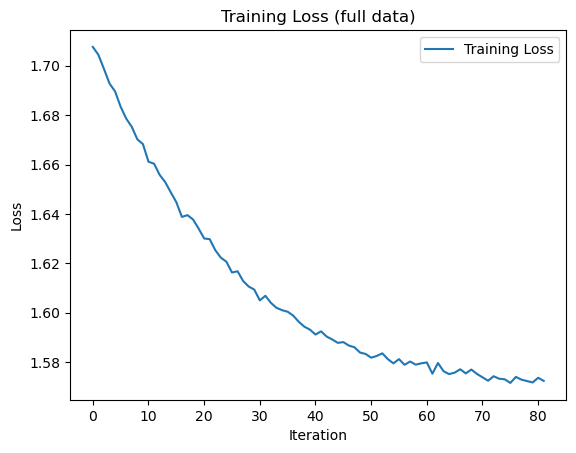

/Volumes/Lab/Development/miniconda-peggyo/envs/pvasi-Vasireddy2025/lib/python3.9/site-packages/gpytorch/models/exact_gp.py:284: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


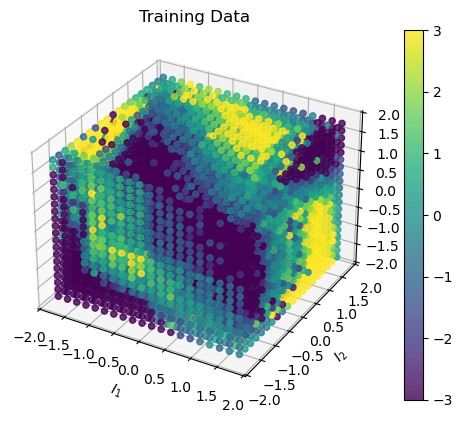

Number of sites: 1, Test R2: -0.4934638167629424
Number of sites: 2, Test R2: 0.724819771350921
Number of sites: 3, Test R2: 0.7233401869471346
Number of sites: 1, Test R2: 0.04204573719645055
Number of sites: 2, Test R2: 0.5882434625627884
Number of sites: 3, Test R2: 0.6048100813515208
Number of sites: 4, Test R2: 0.6131971701547793
Number of sites: 1, Test R2: -0.8688308820888111
Number of sites: 2, Test R2: 0.6559519632415358
Number of sites: 3, Test R2: 0.6531711341275761


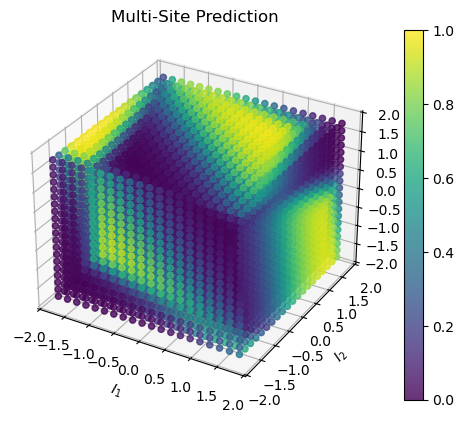

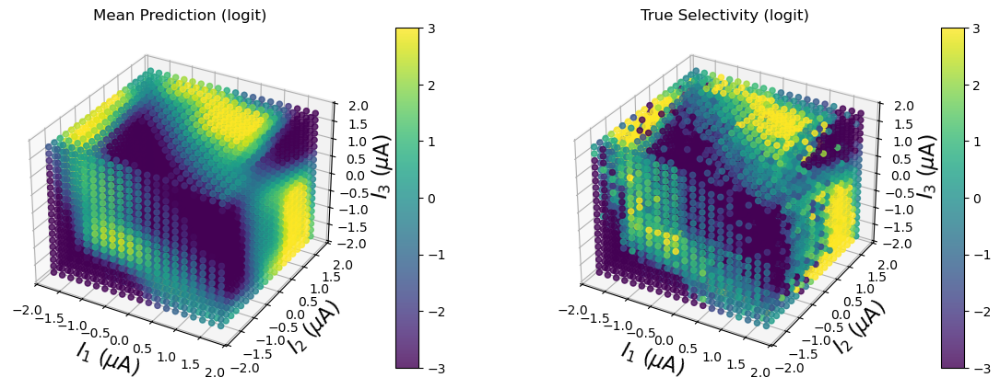

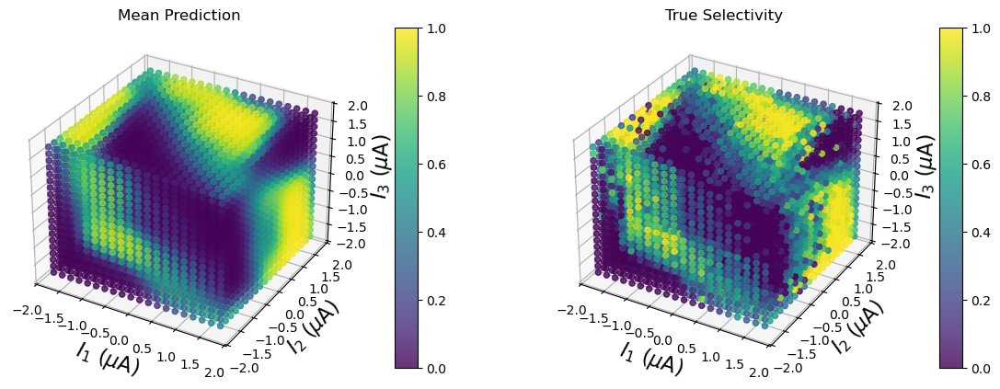

RMSE (full): 0.16479934888986392, RMSE (Multisite, full): 0.18275533537478586
MAE (full): 0.08051783004640298, MAE (Multisite, full): 0.1175376784735076
MAE (Everywhere, full): 0.05861094170922088, MAE (Multisite, Everywhere, full): 0.0684997125698701
RMSE (logit, full): 1.6707939443723576, RMSE (Multisite, logit, full): 2.2376029414481486
MAE (logit, full): 1.2669332048247166, MAE (Multisite, logit, full): 1.8964230847396302
MAE (Everywhere, logit, full): 0.6517356341211675, MAE (Multisite, Everywhere, logit, full): 0.7801534610078786
R2 (full): 0.8800868610293331, R2 (Multisite, full): 0.8154262105374506
CCC (full): 0.933742525554299, CCC (Multisite, full): 0.8902353594752972


In [10]:
selec_probs_full = deepcopy(selectivities[pattern][0])

# Step 1: fitting the GP model

Xdata_full = deepcopy(amps_gsort)
selec_probs_full = np.clip(selec_probs_full, 1e-2, 1-1e-2)
y_full = np.log(selec_probs_full/(1-selec_probs_full))

# Assuming Xdata and y are in numpy format, convert them to torch tensors
amps_plot_torch = torch.tensor(amps_gsort, dtype=torch.float32)
X_train_full = torch.tensor(Xdata_full, dtype=torch.float32)
y_train_full = torch.tensor(y_full.reshape(-1), dtype=torch.float32)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
amps_plot_torch = amps_plot_torch.to(device)
X_train_full = X_train_full.to(device)
y_train_full = y_train_full.to(device)

# Define the GP Model
class GPRegressionModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super(GPRegressionModel, self).__init__(train_x, train_y, likelihood)
        self.mean_constant = ConstantMean()
        # self.mean_linear = LinearMean(input_size=train_x.size(1))
        self.covar_module = RBFKernel()

    def forward(self, x):
        # Add the constant and linear mean components manually
        mean_x = self.mean_constant(x)# + self.mean_linear(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.0):
        """
        :param patience: How many epochs to wait before stopping when loss isn't decreasing.
        :param min_delta: Minimum change in monitored loss to qualify as an improvement.
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.stop = False

    def step(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0

# Initialize the likelihood and model
likelihood_full = GaussianLikelihood()
model_full = GPRegressionModel(X_train_full, y_train_full, likelihood_full)

model_full = model_full.to(device)
likelihood_full = likelihood_full.to(device)

# Set model and likelihood in training mode
model_full.train()
likelihood_full.train()

# Use an optimizer
optimizer_full = torch.optim.AdamW([{'params': model_full.parameters()}], lr=1e-2)

# Set up marginal log likelihood for GPyTorch
mll_full = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood_full, model_full)

# Early stopping setup
early_stopping_full = EarlyStopping(patience=10, min_delta=1e-3)

# Training loop with early stopping
training_iter = 10000
losses_train_full = []
for i in range(training_iter):
    model_full.train()
    likelihood_full.train()
    optimizer_full.zero_grad()
    output_train_full = model_full(X_train_full)

    loss_train_full = -mll_full(output_train_full, y_train_full)

    losses_train_full.append(loss_train_full.item())
    loss_train_full.backward()
    optimizer_full.step()
    early_stopping_full.step(loss_train_full.item())

    if early_stopping_full.stop:
        print(f"Early stopping triggered at iteration {i + 1}")
        break

    if i % 10 == 0:
        print(f"Iteration {i + 1}/{training_iter} - Training Loss: {loss_train_full.item()}")
        print(f"  Lengthscale: {model_full.covar_module.lengthscale}")
        print(f"  Noise: {model_full.likelihood.noise_covar.noise}")

plt.figure()
plt.plot(losses_train_full, label='Training Loss')
plt.legend()
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training Loss (full data)')
plt.show()

# Model evaluation
model_full.eval()
likelihood_full.eval()
with torch.no_grad():
    # Get model predictions
    predictions_full = likelihood_full(model_full(amps_plot_torch))
    mean_full = predictions_full.mean
    var_full = predictions_full.variance
    lower_full, upper_full = predictions_full.confidence_region()

# Plot the raw training data
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$I_1$')
ax.set_ylabel(r'$I_2$')
ax.set_zlabel(r'$I_3$')
ax.set_title('Training Data')

# Scatter plot training data only
scat = ax.scatter(X_train_full.cpu().numpy()[:, 0], 
                X_train_full.cpu().numpy()[:, 1],
                    X_train_full.cpu().numpy()[:, 2], marker='o', c=y_train_full.cpu().numpy(), s=20, alpha=0.8,
                    vmin=-3, vmax=3)

# Add color bar
clb = fig.colorbar(scat, ax=ax)  # Make sure colorbar is linked to the scatter plot
plt.show()

probs_multisite = np.zeros((len(selectivities[pattern][2]), len(amps_gsort)))
for cell_idx in range(len(selectivities[pattern][2])):
    X_sub = deepcopy(amps_gsort)
    probs_fit_sub = deepcopy(selectivities[pattern][2][cell_idx])
    T_sub = deepcopy(max_trials)

    w_inits = []
    for m in ms:
        w_init = np.array(np.random.normal(size=(m, X_sub.shape[1]+1)))
        z = 1 - (1 - zero_prob)**(1/len(w_init))
        w_init[:, 0] = np.clip(w_init[:, 0], None, np.log(z/(1-z)))
        w_init[:, 1:] = np.clip(w_init[:, 1:], -slope_bound, slope_bound)
        w_inits.append(w_init)

    opt, _ = fitting.fit_surface_earlystop(X_sub, probs_fit_sub, T_sub, w_inits,
                                reg_method=reg_method, reg=reg_param, slope_bound=slope_bound,
                                zero_prob=zero_prob, method=method,
                                R2_thresh=R2_thresh, verbose=True                           
    )
    params_subsample, _, _ = opt
    probs_subsample = fitting.sigmoidND_nonlinear(sm.add_constant(amps_gsort, has_constant='add'), 
                                                            params_subsample)
    probs_multisite[cell_idx, :] = probs_subsample

selec_multisite_full = global_selectivity(probs_multisite)
selec_multisite_full = np.clip(selec_multisite_full, 1e-2, 1-1e-2)
selec_multisite_full_logit = np.log(selec_multisite_full/(1-selec_multisite_full))

# Plot the multi-site prediction
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$I_1$')
ax.set_ylabel(r'$I_2$')
ax.set_zlabel(r'$I_3$')
ax.set_title('Multi-Site Prediction')

scat = ax.scatter(amps_gsort[:, 0], 
                amps_gsort[:, 1],
                    amps_gsort[:, 2], marker='o', c=selec_multisite_full, s=20, alpha=0.8,
                    vmin=0, vmax=1)

# Add color bar
clb = fig.colorbar(scat, ax=ax)  # Make sure colorbar is linked to the scatter plot
plt.show()

fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(121, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
ax.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
ax.set_title('Mean Prediction (logit)')

# Scatter plot
scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                c=mean_full.cpu().numpy().flatten(), s=20, alpha=0.8,
                vmin=-3, vmax=3)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.8, aspect=15, pad=0.1)

# Panel 2: Subsampled selectivity
ax2 = fig.add_subplot(122, projection='3d')
scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                    c=selectivities[pattern][1], marker='o', s=20, alpha=0.8, vmin=-3, vmax=3)
ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
ax2.set_title('True Selectivity (logit)')
cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
plt.show()

fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(121, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
ax.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
ax.set_title('Mean Prediction')

# Scatter plot
scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                c=1/(1 + np.exp(-mean_full.cpu().numpy().flatten())), s=20, alpha=0.8,
                vmin=0, vmax=1)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.8, aspect=15, pad=0.1)

# Panel 2: Subsampled selectivity
ax2 = fig.add_subplot(122, projection='3d')
scat2 = ax2.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                    c=selectivities[pattern][0], marker='o', s=20, alpha=0.8, vmin=0, vmax=1)
ax2.set_xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
ax2.set_ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
ax2.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)
ax2.set_title('True Selectivity')
cbar2 = fig.colorbar(scat2, ax=ax2, shrink=0.8, aspect=15, pad=0.1)
plt.show()

probs_pred_full = 1/(1 + np.exp(-mean_full.cpu().numpy().flatten()))

# Inds where either the prediction or the true selectivity is above the cutoff
selective_inds_full = np.where((selectivities[pattern][1] > selec_cutoff) | (mean_full.cpu().numpy().flatten() > selec_cutoff))[0]
selective_inds_full_multisite = np.where((selectivities[pattern][1] > selec_cutoff) | (selec_multisite_full_logit > selec_cutoff))[0]

RMSE_full = np.sqrt(np.mean((probs_pred_full[selective_inds_full] - selectivities[pattern][0][selective_inds_full])**2))
RMSE_full_logit = np.sqrt(np.mean((mean_full.cpu().numpy().flatten()[selective_inds_full] - selectivities[pattern][1][selective_inds_full])**2))
RMSE_multisite_full = np.sqrt(np.mean((selec_multisite_full[selective_inds_full_multisite] - selectivities[pattern][0][selective_inds_full_multisite])**2))
RMSE_multisite_full_logit = np.sqrt(np.mean((selec_multisite_full_logit[selective_inds_full_multisite] - selectivities[pattern][1][selective_inds_full_multisite])**2))

MAE_full = np.mean(np.abs(probs_pred_full[selective_inds_full] - selectivities[pattern][0][selective_inds_full]))
MAE_full_logit = np.mean(np.abs(mean_full.cpu().numpy().flatten()[selective_inds_full] - selectivities[pattern][1][selective_inds_full]))
MAE_multisite_full = np.mean(np.abs(selec_multisite_full[selective_inds_full_multisite] - selectivities[pattern][0][selective_inds_full_multisite]))
MAE_multisite_full_logit = np.mean(np.abs(selec_multisite_full_logit[selective_inds_full_multisite] - selectivities[pattern][1][selective_inds_full_multisite]))

MAE_everywhere_full = np.mean(np.abs(probs_pred_full - selectivities[pattern][0]))
MAE_everywhere_full_logit = np.mean(np.abs(mean_full.cpu().numpy().flatten() - selectivities[pattern][1]))
MAE_everywhere_multisite_full = np.mean(np.abs(selec_multisite_full - selectivities[pattern][0]))
MAE_everywhere_multisite_full_logit = np.mean(np.abs(selec_multisite_full_logit - selectivities[pattern][1]))

R2_full = logit_r_squared(selectivities[pattern][0], probs_pred_full)
R2_multisite_full = logit_r_squared(selectivities[pattern][0], selec_multisite_full)

CCC_full = logit_ccc(selectivities[pattern][0], probs_pred_full)
CCC_multisite_full = logit_ccc(selectivities[pattern][0], selec_multisite_full)

print(f'RMSE (full): {RMSE_full}, RMSE (Multisite, full): {RMSE_multisite_full}') 
print(f'MAE (full): {MAE_full}, MAE (Multisite, full): {MAE_multisite_full}')
print(f'MAE (Everywhere, full): {MAE_everywhere_full}, MAE (Multisite, Everywhere, full): {MAE_everywhere_multisite_full}')

print(f'RMSE (logit, full): {RMSE_full_logit}, RMSE (Multisite, logit, full): {RMSE_multisite_full_logit}')
print(f'MAE (logit, full): {MAE_full_logit}, MAE (Multisite, logit, full): {MAE_multisite_full_logit}')
print(f'MAE (Everywhere, logit, full): {MAE_everywhere_full_logit}, MAE (Multisite, Everywhere, logit, full): {MAE_everywhere_multisite_full_logit}')

print(f'R2 (full): {R2_full}, R2 (Multisite, full): {R2_multisite_full}')
print(f'CCC (full): {CCC_full}, CCC (Multisite, full): {CCC_multisite_full}')

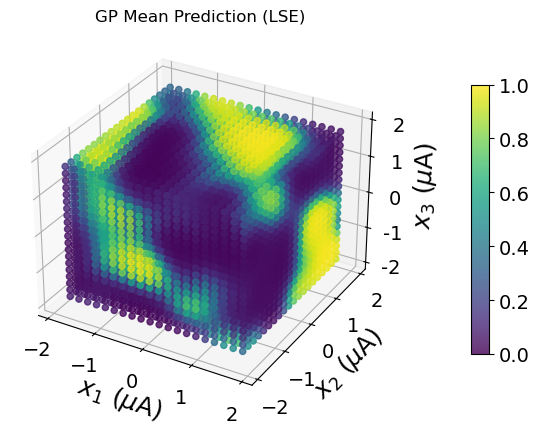

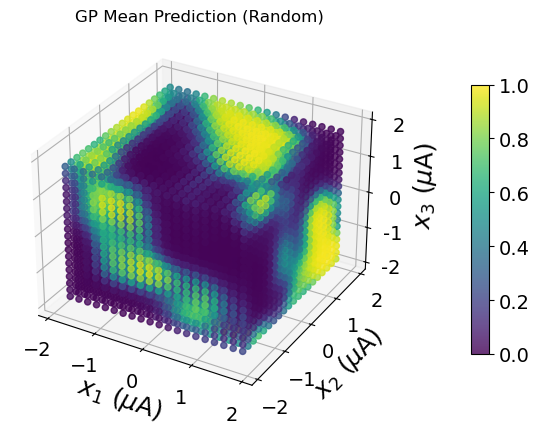

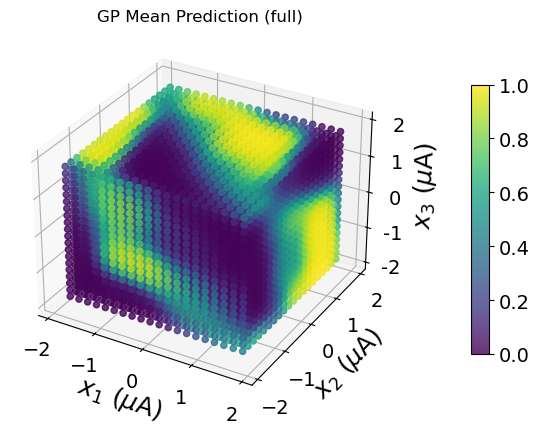

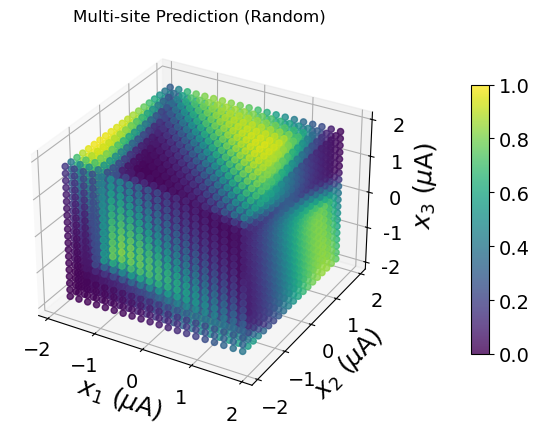

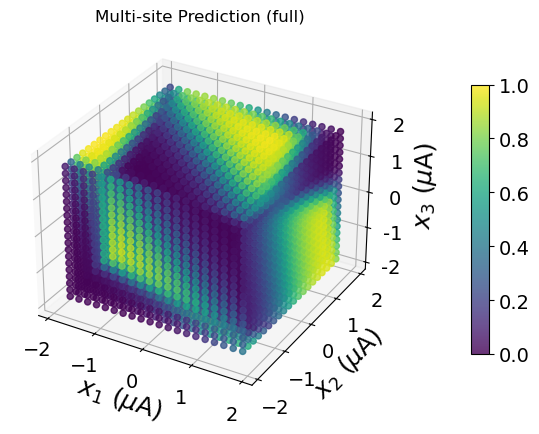

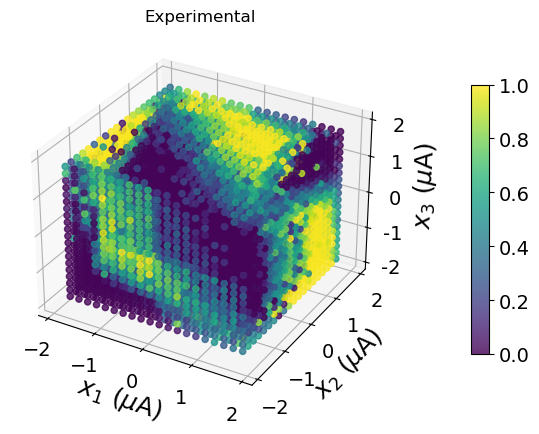

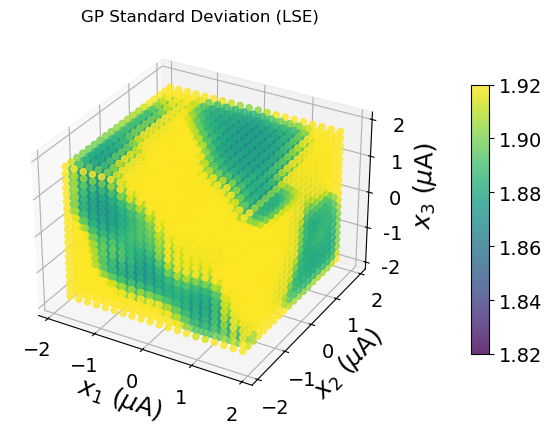

In [11]:
%matplotlib inline

fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$x_1$ ($\mu$A)', fontsize=18)
ax.set_ylabel(r'$x_2$ ($\mu$A)', fontsize=18)
ax.set_zlabel(r'$x_3$ ($\mu$A)', fontsize=18)
ax.set_xlim([-2.2, 2.2])
ax.set_ylim([-2.2, 2.2])
ax.set_zlim([-2.2, 2.2])
plt.xticks([-2, -1, 0, 1, 2], fontsize=14)
plt.yticks([-2, -1, 0, 1, 2], fontsize=14)
# Set z ticks with fontsize 14
ax.set_zticks([-2, -1, 0, 1, 2])
ax.set_zticklabels([-2, -1, 0, 1, 2], fontsize=14)

ax.set_title('GP Mean Prediction (LSE)')

# Scatter plot
scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                c=1/(1 + np.exp(-mean.cpu().numpy().flatten())), s=20, alpha=0.8,
                vmin=0, vmax=1)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.7, aspect=15, pad=0.15)
# Set color bar tick labels to be larger
cbar.ax.tick_params(labelsize=14)
plt.show()

fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$x_1$ ($\mu$A)', fontsize=18)
ax.set_ylabel(r'$x_2$ ($\mu$A)', fontsize=18)
ax.set_zlabel(r'$x_3$ ($\mu$A)', fontsize=18)
ax.set_xlim([-2.2, 2.2])
ax.set_ylim([-2.2, 2.2])
ax.set_zlim([-2.2, 2.2])
plt.xticks([-2, -1, 0, 1, 2], fontsize=14)
plt.yticks([-2, -1, 0, 1, 2], fontsize=14)
# Set z ticks with fontsize 14
ax.set_zticks([-2, -1, 0, 1, 2])
ax.set_zticklabels([-2, -1, 0, 1, 2], fontsize=14)

ax.set_title('GP Mean Prediction (Random)')

# Scatter plot
scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                c=1/(1 + np.exp(-mean_random.cpu().numpy().flatten())), s=20, alpha=0.8,
                vmin=0, vmax=1)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.7, aspect=15, pad=0.15)
# Set color bar tick labels to be larger
cbar.ax.tick_params(labelsize=14)
plt.show()

fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$x_1$ ($\mu$A)', fontsize=18)
ax.set_ylabel(r'$x_2$ ($\mu$A)', fontsize=18)
ax.set_zlabel(r'$x_3$ ($\mu$A)', fontsize=18)
ax.set_xlim([-2.2, 2.2])
ax.set_ylim([-2.2, 2.2])
ax.set_zlim([-2.2, 2.2])
plt.xticks([-2, -1, 0, 1, 2], fontsize=14)
plt.yticks([-2, -1, 0, 1, 2], fontsize=14)
# Set z ticks with fontsize 14
ax.set_zticks([-2, -1, 0, 1, 2])
ax.set_zticklabels([-2, -1, 0, 1, 2], fontsize=14)

ax.set_title('GP Mean Prediction (full)')

# Scatter plot
scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                c=1/(1 + np.exp(-mean_full.cpu().numpy().flatten())), s=20, alpha=0.8,
                vmin=0, vmax=1)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.7, aspect=15, pad=0.15)
# Set color bar tick labels to be larger
cbar.ax.tick_params(labelsize=14)
plt.show()

fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$x_1$ ($\mu$A)', fontsize=18)
ax.set_ylabel(r'$x_2$ ($\mu$A)', fontsize=18)
ax.set_zlabel(r'$x_3$ ($\mu$A)', fontsize=18)
ax.set_xlim([-2.2, 2.2])
ax.set_ylim([-2.2, 2.2])
ax.set_zlim([-2.2, 2.2])
plt.xticks([-2, -1, 0, 1, 2], fontsize=14)
plt.yticks([-2, -1, 0, 1, 2], fontsize=14)
# Set z ticks with fontsize 14
ax.set_zticks([-2, -1, 0, 1, 2])
ax.set_zticklabels([-2, -1, 0, 1, 2], fontsize=14)

ax.set_title('Multi-site Prediction (Random)')

# Scatter plot
scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                c=selec_multisite, s=20, alpha=0.8,
                vmin=0, vmax=1)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.7, aspect=15, pad=0.15)
# Set color bar tick labels to be larger
cbar.ax.tick_params(labelsize=14)
plt.show()

fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$x_1$ ($\mu$A)', fontsize=18)
ax.set_ylabel(r'$x_2$ ($\mu$A)', fontsize=18)
ax.set_zlabel(r'$x_3$ ($\mu$A)', fontsize=18)
ax.set_xlim([-2.2, 2.2])
ax.set_ylim([-2.2, 2.2])
ax.set_zlim([-2.2, 2.2])
plt.xticks([-2, -1, 0, 1, 2], fontsize=14)
plt.yticks([-2, -1, 0, 1, 2], fontsize=14)
# Set z ticks with fontsize 14
ax.set_zticks([-2, -1, 0, 1, 2])
ax.set_zticklabels([-2, -1, 0, 1, 2], fontsize=14)

ax.set_title('Multi-site Prediction (full)')

# Scatter plot
scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                c=selec_multisite_full, s=20, alpha=0.8,
                vmin=0, vmax=1)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.7, aspect=15, pad=0.15)
# Set color bar tick labels to be larger
cbar.ax.tick_params(labelsize=14)
plt.show()

fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')

# Set labels and limits
ax.set_xlabel(r'$x_1$ ($\mu$A)', fontsize=18)
ax.set_ylabel(r'$x_2$ ($\mu$A)', fontsize=18)
ax.set_zlabel(r'$x_3$ ($\mu$A)', fontsize=18)
ax.set_xlim([-2.2, 2.2])
ax.set_ylim([-2.2, 2.2])
ax.set_zlim([-2.2, 2.2])
plt.xticks([-2, -1, 0, 1, 2], fontsize=14)
plt.yticks([-2, -1, 0, 1, 2], fontsize=14)
# Set z ticks with fontsize 14
ax.set_zticks([-2, -1, 0, 1, 2])
ax.set_zticklabels([-2, -1, 0, 1, 2], fontsize=14)

ax.set_title('Experimental')

scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2],
                    c=selectivities[pattern][0], marker='o', s=20, alpha=0.8, vmin=0, vmax=1)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.7, aspect=15, pad=0.15)
# Set color bar tick labels to be larger
cbar.ax.tick_params(labelsize=14)
plt.show()

fig = plt.figure(figsize=(7, 5))
ax = fig.add_subplot(111, projection='3d')  # Create a 3D subplot

# Set labels and limits
ax.set_xlabel(r'$x_1$ ($\mu$A)', fontsize=18)
ax.set_ylabel(r'$x_2$ ($\mu$A)', fontsize=18)
ax.set_zlabel(r'$x_3$ ($\mu$A)', fontsize=18)
ax.set_xlim([-2.2, 2.2])
ax.set_ylim([-2.2, 2.2])
ax.set_zlim([-2.2, 2.2])
plt.xticks([-2, -1, 0, 1, 2], fontsize=14)
plt.yticks([-2, -1, 0, 1, 2], fontsize=14)
# Set z ticks with fontsize 14
ax.set_zticks([-2, -1, 0, 1, 2])
ax.set_zticklabels([-2, -1, 0, 1, 2], fontsize=14)

ax.set_title('GP Standard Deviation (LSE)')

scat = ax.scatter(amps_gsort[:, 0], amps_gsort[:, 1], amps_gsort[:, 2], marker='o', 
                c=np.sqrt(var.cpu().numpy().flatten()), 
                s=20, alpha=0.8,
                vmin=1.82, vmax=1.92)

# Add color bar
cbar = fig.colorbar(scat, ax=ax, shrink=0.7, aspect=15, pad=0.15)
# Set color bar tick labels to be larger
cbar.ax.tick_params(labelsize=14)
plt.show()

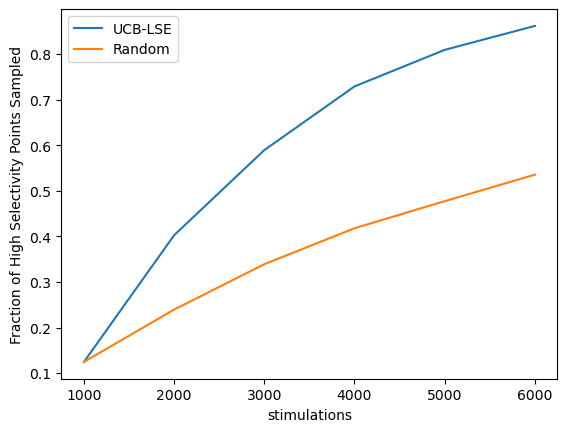

In [12]:
%matplotlib inline

plt.figure()
plt.plot(np.array(num_samples), success_fractions, label='UCB-LSE')
plt.plot(np.array(num_samples_random), success_fractions_random, label='Random')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel('Fraction of High Selectivity Points Sampled')
plt.show()

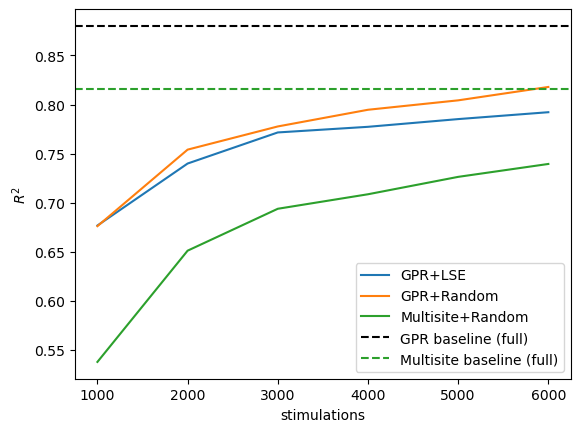

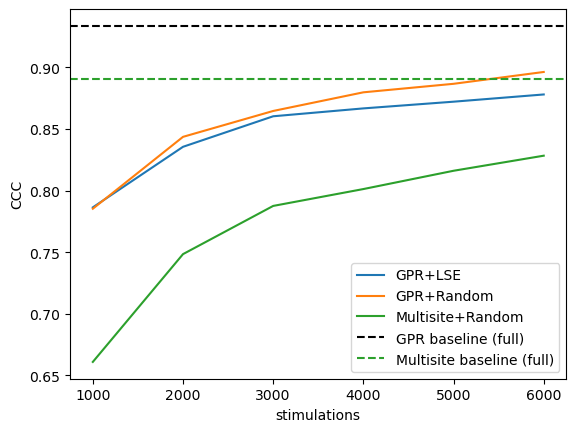

In [13]:
plt.figure()
plt.plot(np.array(num_samples), R2s, label='GPR+LSE')
plt.plot(np.array(num_samples_random), R2s_random, label='GPR+Random')
plt.plot(np.array(num_samples), R2s_multisite, label='Multisite+Random')
plt.axhline(y=R2_full, color='k', linestyle='--', label='GPR baseline (full)')
plt.axhline(y=R2_multisite_full, color='tab:green', linestyle='--', label='Multisite baseline (full)')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel(r'$R^2$')
plt.show()

plt.figure()
plt.plot(np.array(num_samples), CCCs, label='GPR+LSE')
plt.plot(np.array(num_samples_random), CCCs_random, label='GPR+Random')
plt.plot(np.array(num_samples), CCCs_multisite, label='Multisite+Random')
plt.axhline(y=CCC_full, color='k', linestyle='--', label='GPR baseline (full)')
plt.axhline(y=CCC_multisite_full, color='tab:green', linestyle='--', label='Multisite baseline (full)')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel('CCC')
plt.show()

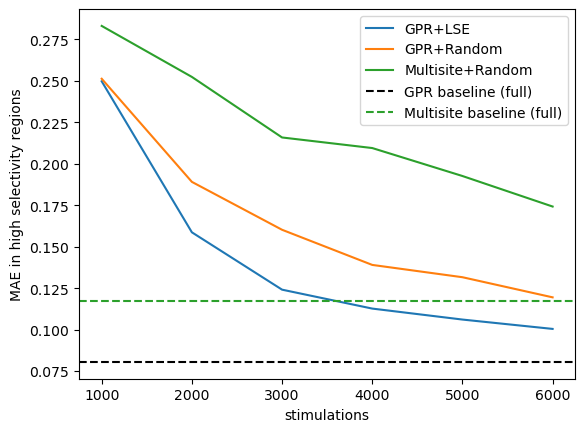

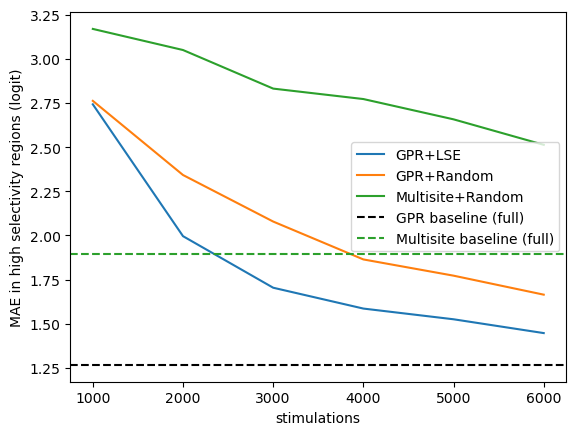

In [14]:
plt.figure()
plt.plot(np.array(num_samples), MAEs, label='GPR+LSE')
plt.plot(np.array(num_samples_random), MAEs_random, label='GPR+Random')
plt.plot(np.array(num_samples), MAEs_multisite, label='Multisite+Random')
plt.axhline(y=MAE_full, color='k', linestyle='--', label='GPR baseline (full)')
plt.axhline(y=MAE_multisite_full, color='tab:green', linestyle='--', label='Multisite baseline (full)')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel('MAE in high selectivity regions')
plt.show()

plt.figure()
plt.plot(np.array(num_samples), MAEs_logit, label='GPR+LSE')
plt.plot(np.array(num_samples_random), MAEs_random_logit, label='GPR+Random')
plt.plot(np.array(num_samples), MAEs_multisite_logit, label='Multisite+Random')
plt.axhline(y=MAE_full_logit, color='k', linestyle='--', label='GPR baseline (full)')
plt.axhline(y=MAE_multisite_full_logit, color='tab:green', linestyle='--', label='Multisite baseline (full)')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel('MAE in high selectivity regions (logit)')
plt.show()

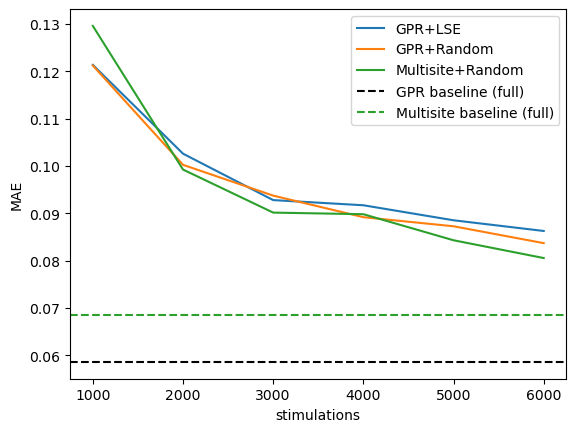

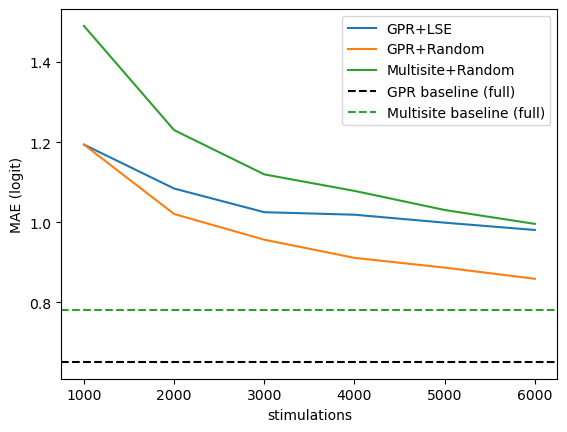

In [15]:
plt.figure()
plt.plot(np.array(num_samples), MAEs_everywhere, label='GPR+LSE')
plt.plot(np.array(num_samples_random), MAEs_everywhere_random, label='GPR+Random')
plt.plot(np.array(num_samples), MAEs_everywhere_multisite, label='Multisite+Random')
plt.axhline(y=MAE_everywhere_full, color='k', linestyle='--', label='GPR baseline (full)')
plt.axhline(y=MAE_everywhere_multisite_full, color='tab:green', linestyle='--', label='Multisite baseline (full)')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel('MAE')
plt.show()

plt.figure()
plt.plot(np.array(num_samples), MAEs_everywhere_logit, label='GPR+LSE')
plt.plot(np.array(num_samples_random), MAEs_everywhere_random_logit, label='GPR+Random')
plt.plot(np.array(num_samples), MAEs_everywhere_multisite_logit, label='Multisite+Random')
plt.axhline(y=MAE_everywhere_full_logit, color='k', linestyle='--', label='GPR baseline (full)')
plt.axhline(y=MAE_everywhere_multisite_full_logit, color='tab:green', linestyle='--', label='Multisite baseline (full)')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel('MAE (logit)')
plt.show()

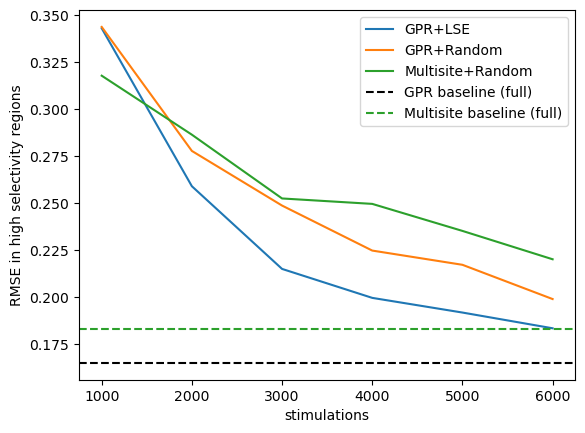

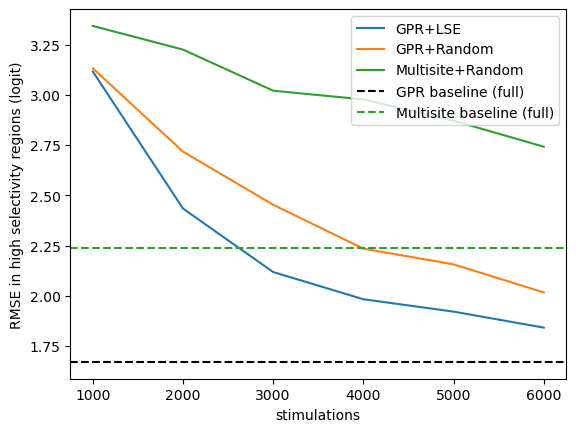

In [16]:
plt.figure()
plt.plot(np.array(num_samples), RMSEs, label='GPR+LSE')
plt.plot(np.array(num_samples_random), RMSEs_random, label='GPR+Random')
plt.plot(np.array(num_samples), RMSEs_multisite, label='Multisite+Random')
plt.axhline(y=RMSE_full, color='k', linestyle='--', label='GPR baseline (full)')
plt.axhline(y=RMSE_multisite_full, color='tab:green', linestyle='--', label='Multisite baseline (full)')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel('RMSE in high selectivity regions')
plt.show()

plt.figure()
plt.plot(np.array(num_samples), RMSEs_logit, label='GPR+LSE')
plt.plot(np.array(num_samples_random), RMSEs_random_logit, label='GPR+Random')
plt.plot(np.array(num_samples), RMSEs_multisite_logit, label='Multisite+Random')
plt.axhline(y=RMSE_full_logit, color='k', linestyle='--', label='GPR baseline (full)')
plt.axhline(y=RMSE_multisite_full_logit, color='tab:green', linestyle='--', label='Multisite baseline (full)')
plt.legend()
plt.xlabel('stimulations')
plt.ylabel('RMSE in high selectivity regions (logit)')
plt.show()